In [1]:
%run neural_simulation_functions.ipynb

In [2]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [4]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 
rates = np.linspace(5, 15, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [5]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [7]:
raw_spike_train = independent_poisson_processes(num_neurons, rate, time, num_samples)
# print(raw_spike_train)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [8]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [9]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [10]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, rates, time, num_samples)

In [11]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [12]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [13]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

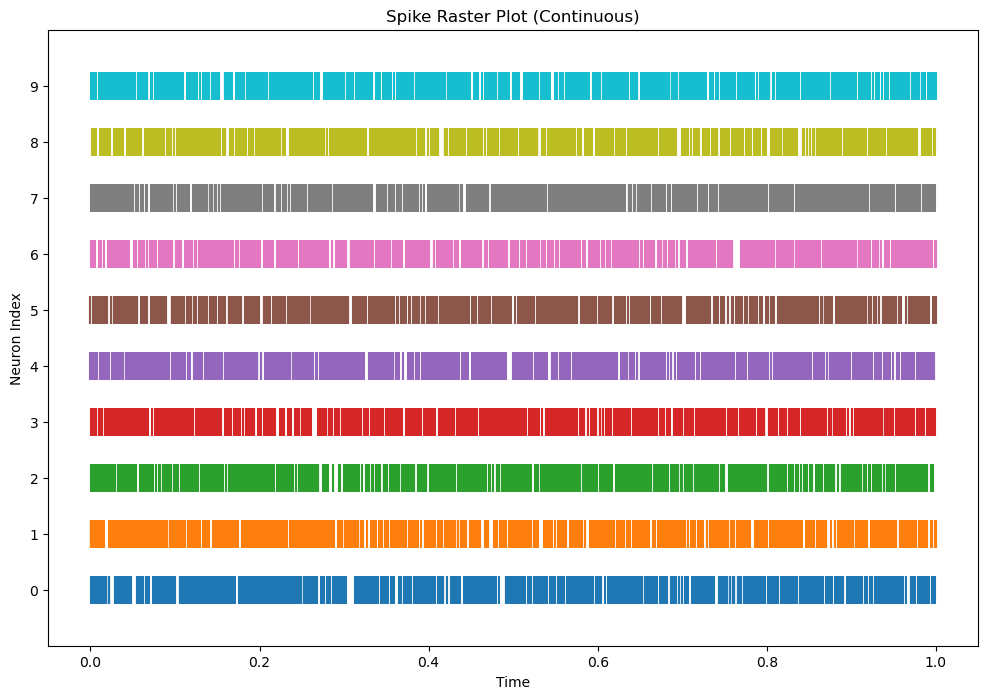

In [14]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [15]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)

In [16]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

In [17]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [19]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [20]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [21]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [22]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

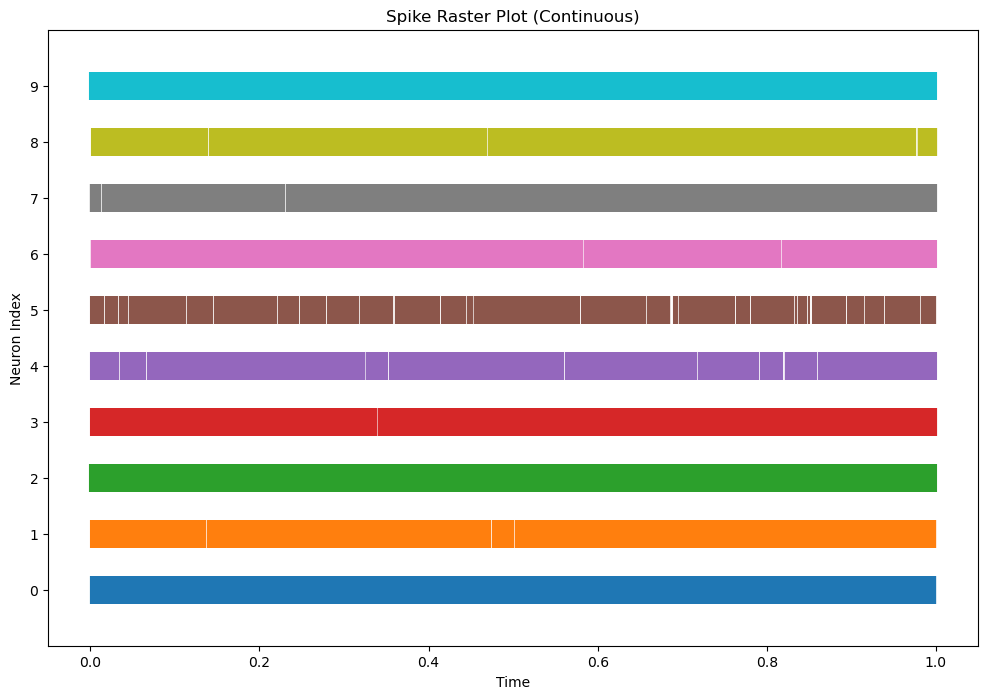

In [23]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

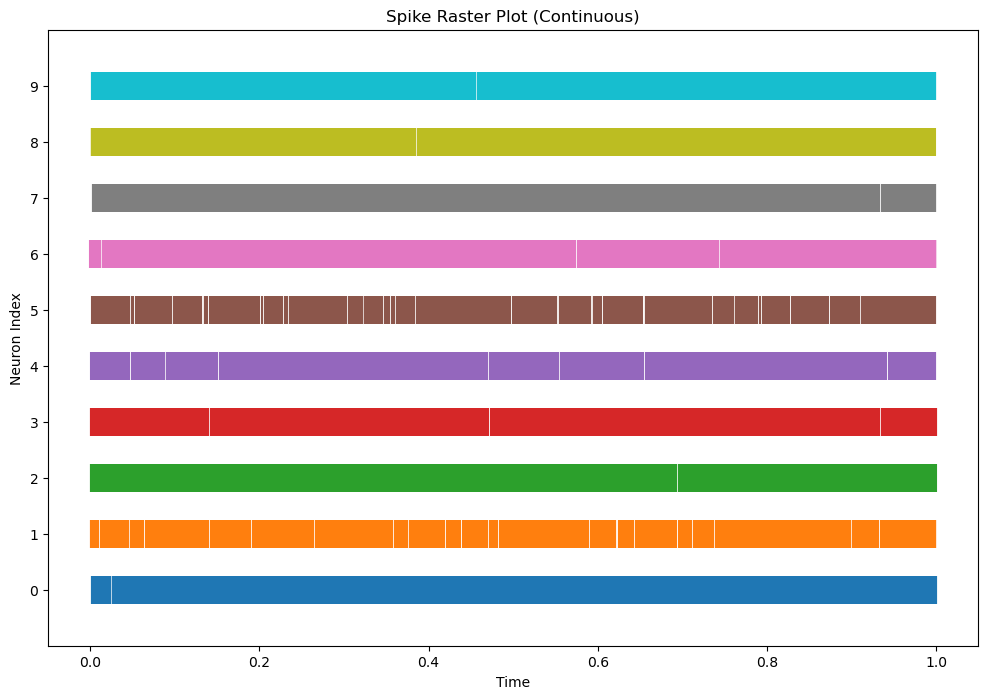

In [24]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [25]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [26]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [27]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [29]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

(10, 1000)
(10,)


In [30]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
print(multi_rate_empirical_mean.shape)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
print(multi_rate_count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

(10, 1000)
(10,)


In [31]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [32]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=1, recommended exclude=2
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=2


In [33]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [34]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [35]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
print(res_var)

0.01530247834058406


In [36]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [37]:
multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [39]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [40]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

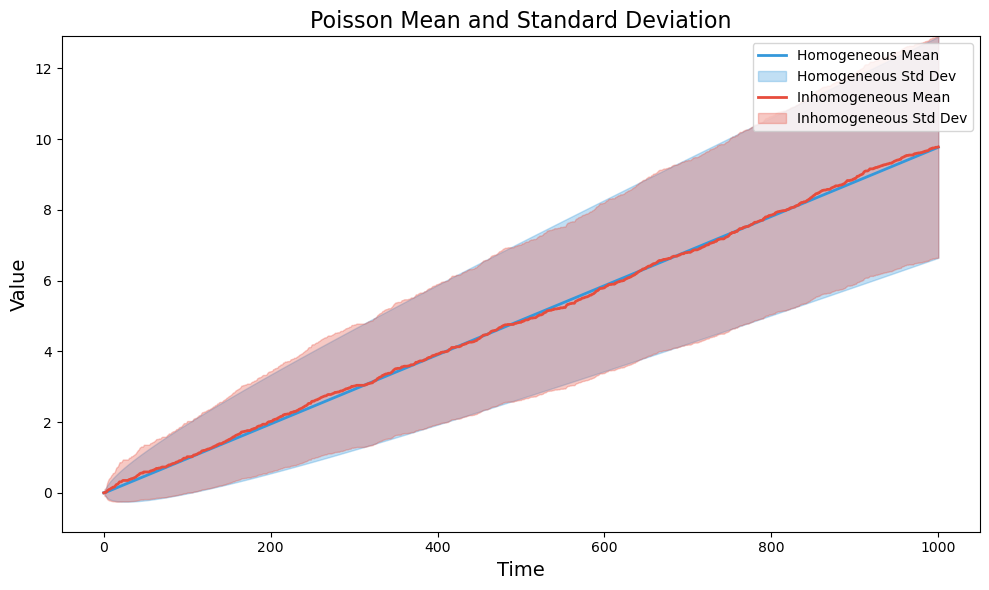

In [41]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

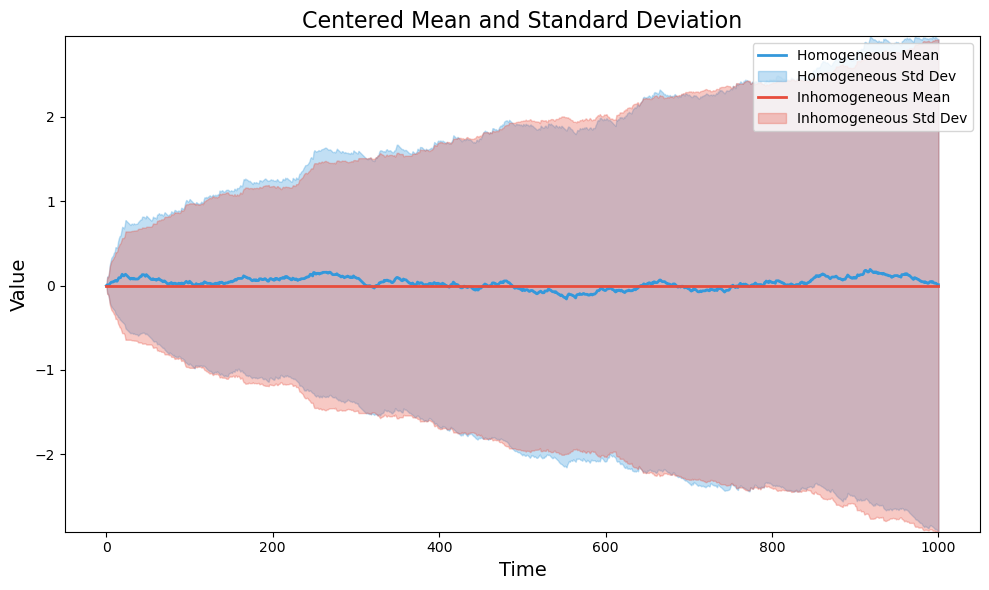

In [42]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

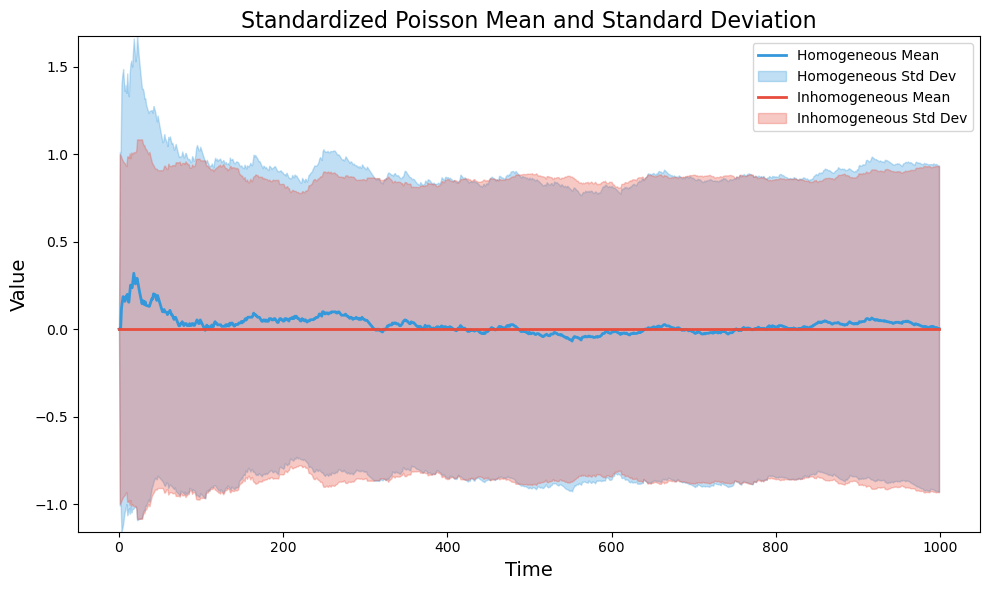

In [43]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

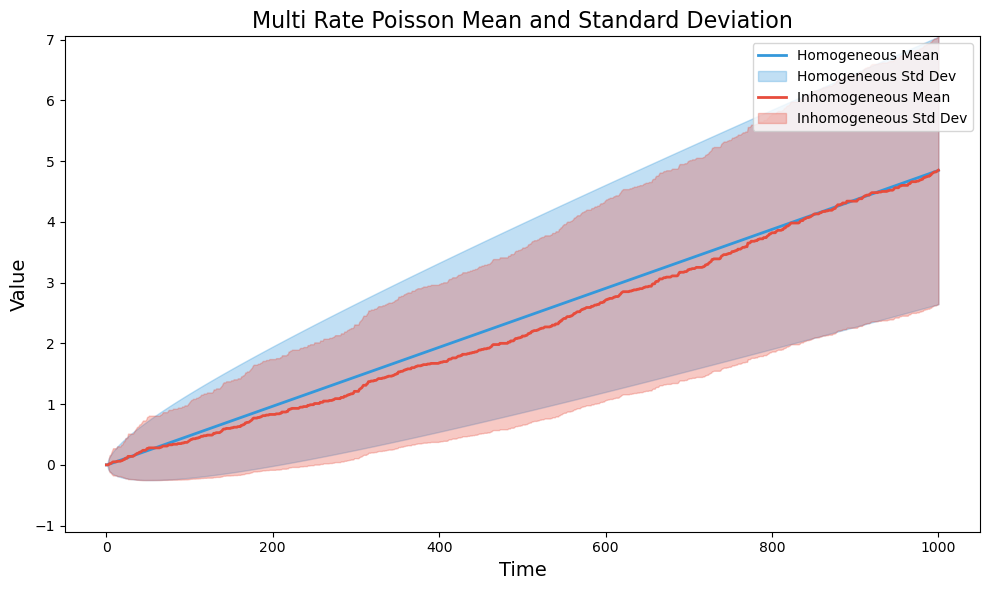

In [44]:
plot_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')

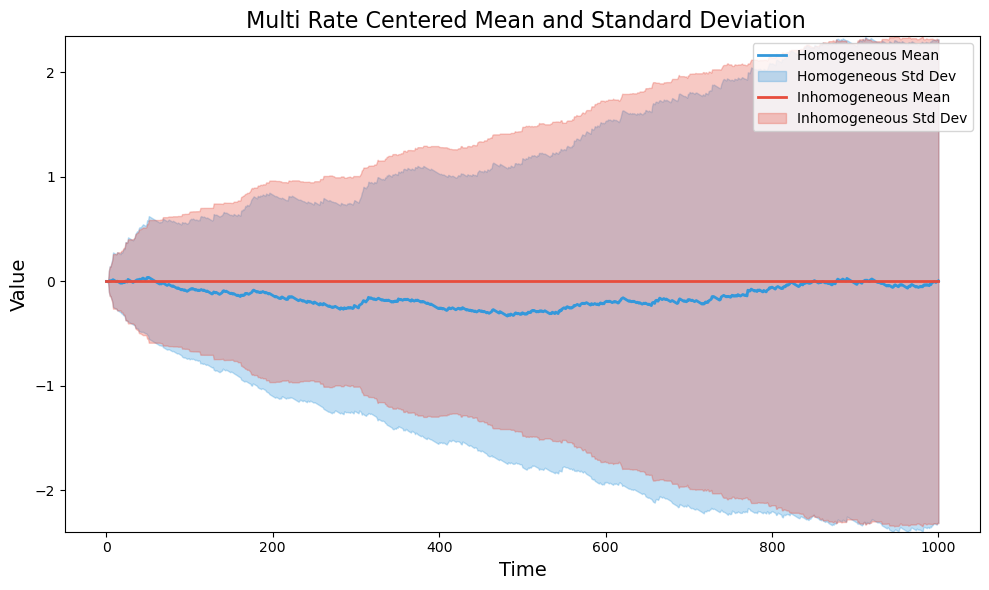

In [45]:
plot_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Mean and Standard Deviation')

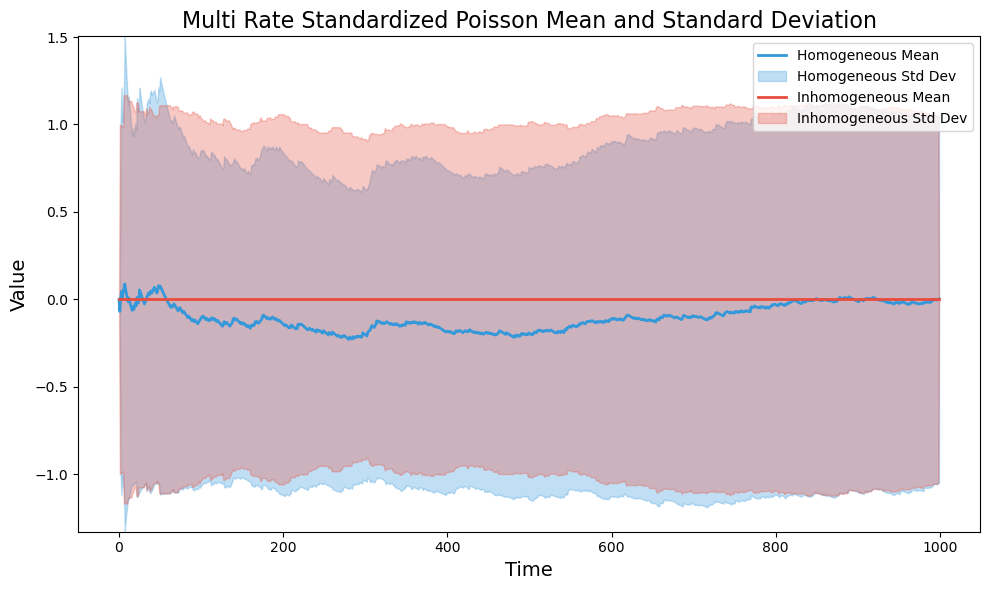

In [46]:
plot_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')

In [47]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
print(mean_check_emp)

{'mean': np.float64(0.03851530887762546), 'se': np.float64(0.0009847822681802287), 'CI_95%': (np.float64(0.036585168760864276), np.float64(0.04044544899438665)), 'interpretation': 'The true population mean is estimated to be between 0.04 and 0.04 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(-3.1864178740793282e-18), 'se': np.float64(0.0009687119852890935), 'CI_95%': (np.float64(-0.0018986429029118842), np.float64(0.0018986429029118777)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [48]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
print(multi_rate_mean_check)

multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)
print(multi_rate_mean_check_emp)

{'mean': np.float64(-0.011783751957626272), 'se': np.float64(0.0010063863640843481), 'CI_95%': (np.float64(-0.013756235375580276), np.float64(-0.009811268539672268)), 'interpretation': 'The true population mean is estimated to be between -0.01 and -0.01 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(-4.556586682229099e-18), 'se': np.float64(0.001007630442707945), 'CI_95%': (np.float64(-0.0019749217726020185), np.float64(0.001974921772602009)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [49]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
print(t_stat)
print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
print(t_stat_emp)
print(p_val_mean_emp)

0.0
1.0
0.0
1.0


In [50]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))
print(multi_rate_t_stat)
print(multi_rate_p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))
print(t_stat_emp)
print(p_val_mean_emp)

0.0
1.0
0.0
1.0


In [51]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [52]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [53]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [54]:
#print(transpose_stands[:,:,0:3])

In [55]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [56]:
#print(reshaped_stands[:,:5])

In [57]:
#### TESTING #####

In [58]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 1 ) ===
Max |mean|: 1.377e-16 (should be close to 0)
Max |std - 1|: 3.331e-16 (should be close to 0)


In [59]:
print(test_stand.shape)

(100, 10, 1000)


In [60]:
cov_matrix = cov_standardized_data(reshaped_stands)
print(cov_matrix.shape)
print(cov_matrix)

(10, 10)
[[ 0.79620285 -0.00305207  0.00575753  0.00450605 -0.0402615  -0.06487989
   0.02891402 -0.06636452 -0.04342859 -0.0058439 ]
 [-0.00305207  1.05606823  0.01779135  0.04334833  0.09260305 -0.0385322
  -0.15927049  0.07016712 -0.07262409  0.03600303]
 [ 0.00575753  0.01779135  0.98992926  0.03132543  0.00764083 -0.11648714
  -0.01322493  0.12036101 -0.01228906  0.07522649]
 [ 0.00450605  0.04334833  0.03132543  0.96970927 -0.11379691 -0.07354517
  -0.02140016  0.04384214  0.12765575 -0.02154161]
 [-0.0402615   0.09260305  0.00764083 -0.11379691  0.89257937  0.11290335
   0.04070772 -0.04585256  0.13807082 -0.01968115]
 [-0.06487989 -0.0385322  -0.11648714 -0.07354517  0.11290335  0.96343556
  -0.02380302  0.05200558 -0.02850469 -0.08180644]
 [ 0.02891402 -0.15927049 -0.01322493 -0.02140016  0.04070772 -0.02380302
   1.15346428 -0.09211629 -0.00701791 -0.03680865]
 [-0.06636452  0.07016712  0.12036101  0.04384214 -0.04585256  0.05200558
  -0.09211629  1.06186969  0.04580973  0.08

In [61]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
print(multi_rate_cov_matrix.shape)
print(multi_rate_cov_matrix)

(10, 10)
[[ 1.01274432e+00  1.18286654e-01 -5.40976059e-02  1.32397462e-01
   5.56737461e-02 -8.78021263e-02  8.34115453e-03  1.04032126e-01
   1.12637839e-03 -1.40892394e-02]
 [ 1.18286654e-01  7.95586387e-01  4.94010837e-02  7.38883775e-02
   1.62915906e-01 -1.12667437e-01  7.91487830e-03 -8.37277825e-02
  -2.60886026e-02  5.65060189e-02]
 [-5.40976059e-02  4.94010837e-02  1.12889173e+00  8.73319100e-03
   2.20307326e-02 -8.62472109e-04 -3.75045773e-02 -6.19267319e-02
   1.89817714e-03 -2.54832410e-02]
 [ 1.32397462e-01  7.38883775e-02  8.73319100e-03  1.06259020e+00
  -4.50160225e-02  5.93754593e-02  2.72667353e-03  4.20803445e-02
  -1.39173096e-02  3.74257779e-03]
 [ 5.56737461e-02  1.62915906e-01  2.20307326e-02 -4.50160225e-02
   1.10216695e+00 -3.85155030e-02  4.93773867e-03 -1.04572235e-01
   1.68797605e-01  1.59647646e-01]
 [-8.78021263e-02 -1.12667437e-01 -8.62472109e-04  5.93754593e-02
  -3.85155030e-02  9.80631536e-01  8.95872912e-03 -1.11537237e-02
  -4.43019349e-02  6.139

In [62]:
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

In [63]:
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

array([[ 0.79620285, -0.00305207,  0.00575753,  0.00450605, -0.0402615 ,
        -0.06487989,  0.02891402, -0.06636452, -0.04342859, -0.0058439 ],
       [-0.00305207,  1.05606823,  0.01779135,  0.04334833,  0.09260305,
        -0.0385322 , -0.15927049,  0.07016712, -0.07262409,  0.03600303],
       [ 0.00575753,  0.01779135,  0.98992926,  0.03132543,  0.00764083,
        -0.11648714, -0.01322493,  0.12036101, -0.01228906,  0.07522649],
       [ 0.00450605,  0.04334833,  0.03132543,  0.96970927, -0.11379691,
        -0.07354517, -0.02140016,  0.04384214,  0.12765575, -0.02154161],
       [-0.0402615 ,  0.09260305,  0.00764083, -0.11379691,  0.89257937,
         0.11290335,  0.04070772, -0.04585256,  0.13807082, -0.01968115],
       [-0.06487989, -0.0385322 , -0.11648714, -0.07354517,  0.11290335,
         0.96343556, -0.02380302,  0.05200558, -0.02850469, -0.08180644],
       [ 0.02891402, -0.15927049, -0.01322493, -0.02140016,  0.04070772,
        -0.02380302,  1.15346428, -0.09211629

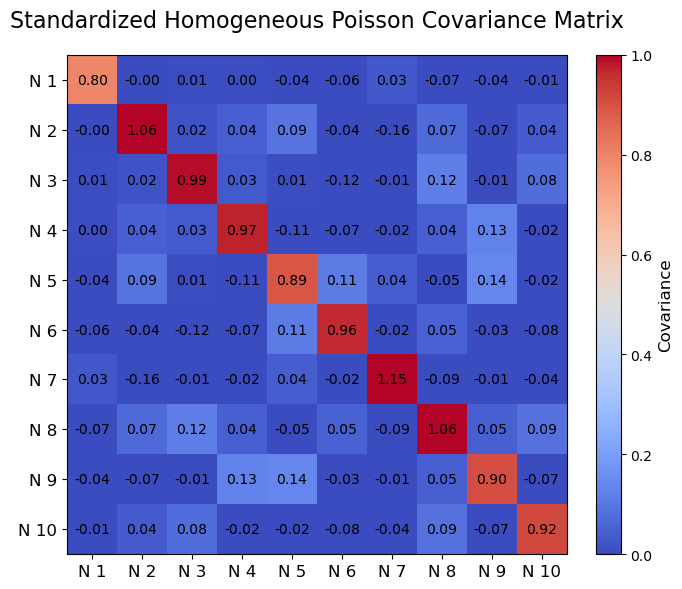

In [64]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True)

array([[ 0.7629228 , -0.00469394,  0.00400013,  0.00343641, -0.04229201,
        -0.06393519,  0.02996587, -0.06829059, -0.04158805, -0.00812752],
       [-0.00469394,  0.99723211,  0.01406173,  0.03561788,  0.08089925,
        -0.0389929 , -0.15511768,  0.06766656, -0.07300833,  0.03107463],
       [ 0.00400013,  0.01406173,  0.93811112,  0.02534845,  0.00264504,
        -0.11459798, -0.00826488,  0.11924509, -0.01447615,  0.06871559],
       [ 0.00343641,  0.03561788,  0.02534845,  0.90293536, -0.11963336,
        -0.07266701, -0.01385017,  0.0415289 ,  0.12096698, -0.02914757],
       [-0.04229201,  0.08089925,  0.00264504, -0.11963336,  0.8228586 ,
         0.10918544,  0.04836084, -0.04666621,  0.12997272, -0.02919897],
       [-0.06393519, -0.0389929 , -0.11459798, -0.07266701,  0.10918544,
         0.95893056, -0.02409679,  0.05135185, -0.02877124, -0.08034512],
       [ 0.02996587, -0.15511768, -0.00826488, -0.01385017,  0.04836084,
        -0.02409679,  1.1981705 , -0.09339517

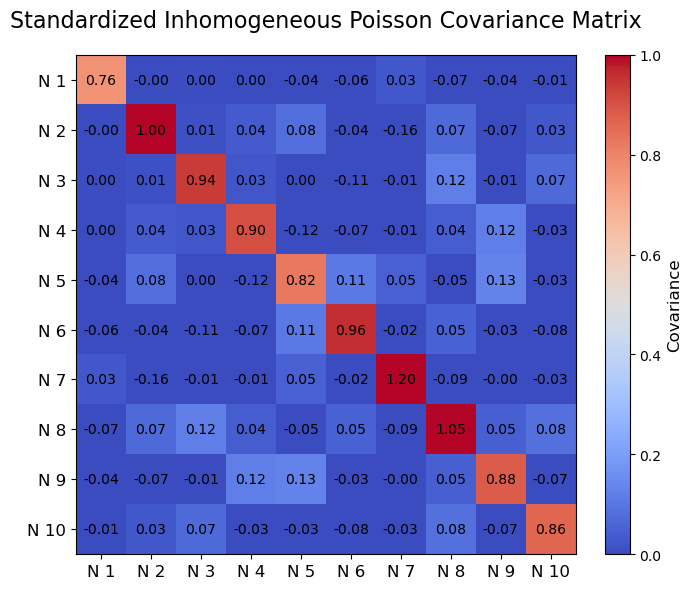

In [65]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True)

array([[ 1.01274432e+00,  1.18286654e-01, -5.40976059e-02,
         1.32397462e-01,  5.56737461e-02, -8.78021263e-02,
         8.34115453e-03,  1.04032126e-01,  1.12637839e-03,
        -1.40892394e-02],
       [ 1.18286654e-01,  7.95586387e-01,  4.94010837e-02,
         7.38883775e-02,  1.62915906e-01, -1.12667437e-01,
         7.91487830e-03, -8.37277825e-02, -2.60886026e-02,
         5.65060189e-02],
       [-5.40976059e-02,  4.94010837e-02,  1.12889173e+00,
         8.73319100e-03,  2.20307326e-02, -8.62472109e-04,
        -3.75045773e-02, -6.19267319e-02,  1.89817714e-03,
        -2.54832410e-02],
       [ 1.32397462e-01,  7.38883775e-02,  8.73319100e-03,
         1.06259020e+00, -4.50160225e-02,  5.93754593e-02,
         2.72667353e-03,  4.20803445e-02, -1.39173096e-02,
         3.74257779e-03],
       [ 5.56737461e-02,  1.62915906e-01,  2.20307326e-02,
        -4.50160225e-02,  1.10216695e+00, -3.85155030e-02,
         4.93773867e-03, -1.04572235e-01,  1.68797605e-01,
         1.

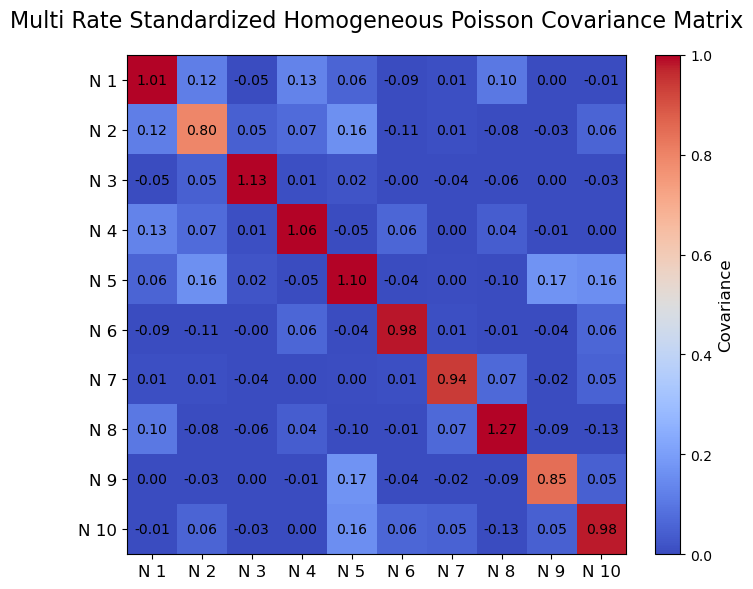

In [66]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True)

array([[ 1.07741263e+00,  1.13578776e-01, -5.43669172e-02,
         1.37766983e-01,  6.12740838e-02, -9.32924663e-02,
         1.11066449e-02,  1.11278146e-01,  6.20185116e-03,
        -1.71191480e-02],
       [ 1.13578776e-01,  8.41735543e-01,  5.29658686e-02,
         7.26975220e-02,  1.71314585e-01, -1.19216776e-01,
         1.11398885e-02, -8.29809539e-02, -2.18749483e-02,
         5.42069951e-02],
       [-5.43669172e-02,  5.29658686e-02,  1.11440732e+00,
         9.13318687e-03,  2.19016827e-02, -8.96054815e-04,
        -3.70894930e-02, -6.15378567e-02,  7.59345657e-04,
        -2.54748646e-02],
       [ 1.37766983e-01,  7.26975220e-02,  9.13318687e-03,
         1.07070102e+00, -4.40978175e-02,  5.87760891e-02,
         3.32316424e-03,  4.27685442e-02, -1.18245998e-02,
         2.60197102e-03],
       [ 6.12740838e-02,  1.71314585e-01,  2.19016827e-02,
        -4.40978175e-02,  1.07726001e+00, -3.91852005e-02,
         4.03458326e-03, -1.04200759e-01,  1.63653388e-01,
         1.

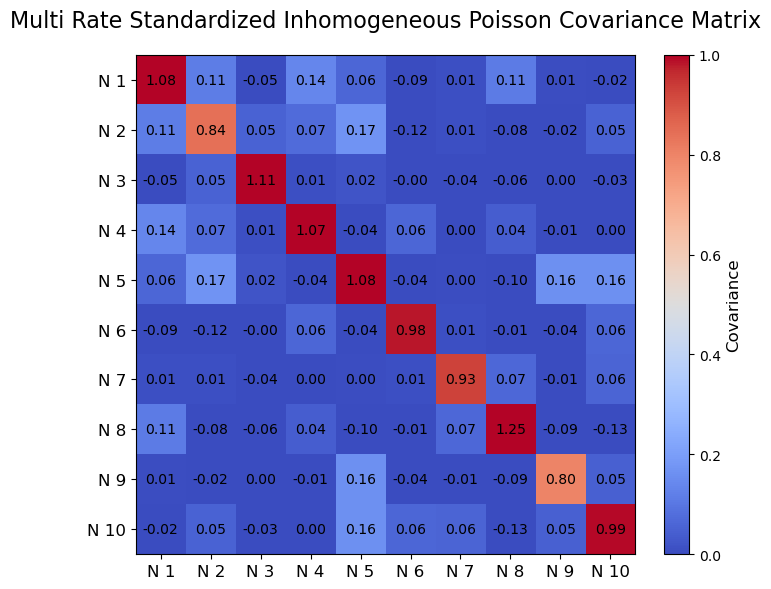

In [67]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True)

In [68]:
#### TESTING END #####

In [69]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [70]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

In [71]:
#goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

In [72]:
#goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [73]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [74]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

Theoretical and Empirical stats of excitatory counts.

In [76]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [77]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [78]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [79]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
print(res_var_ex)

0.00554910579657963


In [80]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

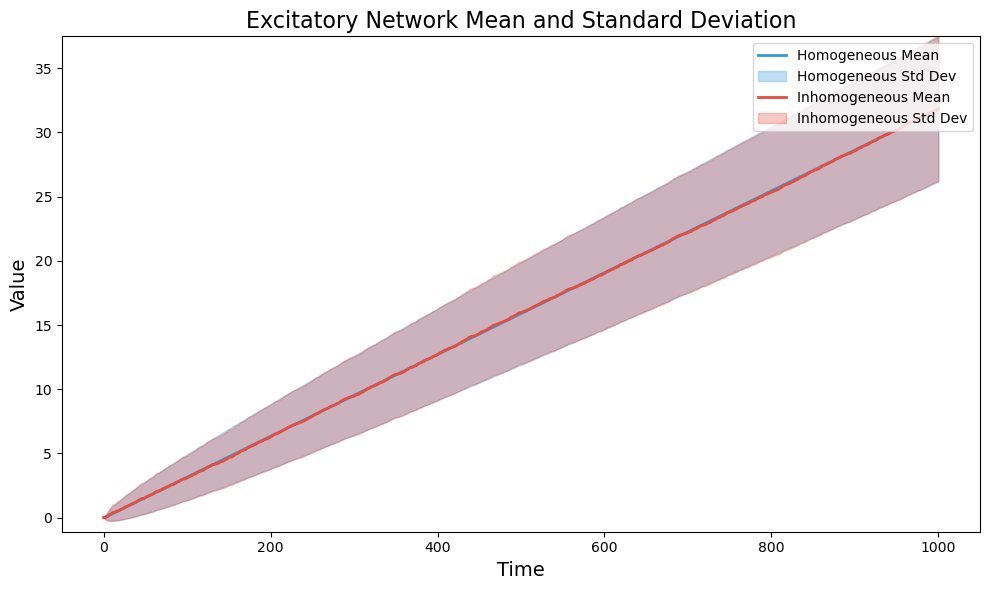

In [81]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

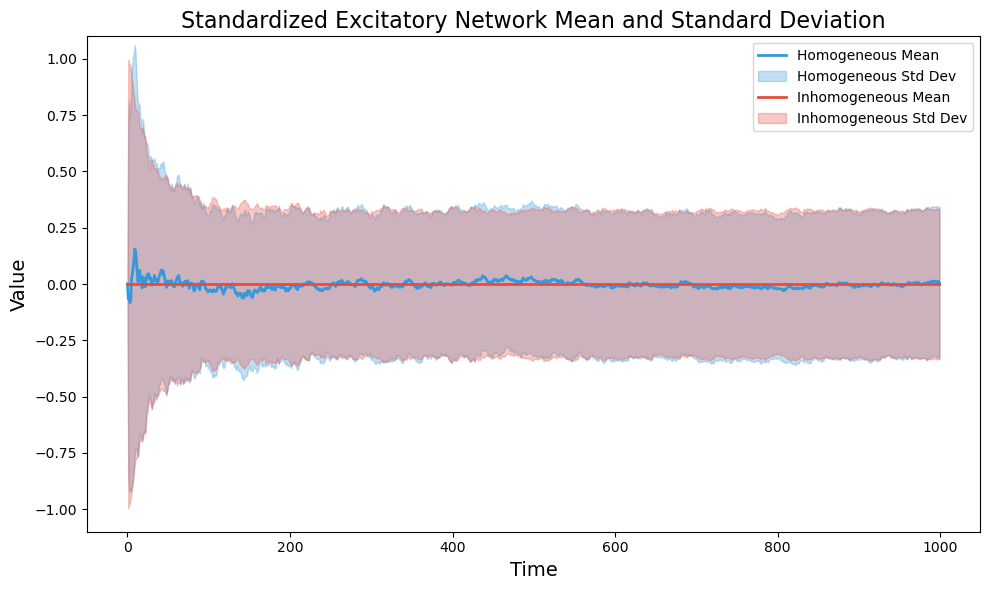

In [82]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [83]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
print(mean_check_ex_emp)

{'mean': np.float64(0.006517331447465378), 'se': np.float64(0.0003875779103055042), 'CI_95%': (np.float64(0.00575769178170099), np.float64(0.007276971113229765)), 'interpretation': 'The true population mean is estimated to be between 0.01 and 0.01 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(-3.072617235719352e-18), 'se': np.float64(0.00038258441710386875), 'CI_95%': (np.float64(-0.0007498525870743353), np.float64(0.0007498525870743292)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [84]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [85]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [86]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
print(transpose_stands_ex[:,:,0:3])

[[[-0.17843766 -0.25234896 -0.3090631 ]
  [-0.17843766 -0.25234896 -0.3090631 ]
  [-0.17843766 -0.25234896 -0.3090631 ]
  ...
  [-0.17843766 -0.25234896 -0.3090631 ]
  [-0.17843766 -0.25234896 -0.3090631 ]
  [-0.17843766 -0.25234896 -0.3090631 ]]

 [[ 6.2713201   4.32447024  3.44108199]
  [-0.15559563 -0.22004545 -0.26949954]
  [-0.15559563 -0.22004545 -0.26949954]
  ...
  [-0.15559563 -0.22004545 -0.26949954]
  [-0.15559563 -0.22004545 -0.26949954]
  [-0.15559563 -0.22004545 -0.26949954]]

 [[-0.15949922 -0.22556595 -0.27626075]
  [-0.15949922 -0.22556595 -0.27626075]
  [-0.15949922 -0.22556595 -0.27626075]
  ...
  [-0.15949922 -0.22556595 -0.27626075]
  [-0.15949922 -0.22556595 -0.27626075]
  [-0.15949922 -0.22556595 -0.27626075]]

 ...

 [[-0.16634302 -0.23524455 -0.28811456]
  [-0.16634302 -0.23524455 -0.28811456]
  [-0.16634302 -0.23524455 -0.28811456]
  ...
  [-0.16634302 -0.23524455 -0.28811456]
  [-0.16634302 -0.23524455 -0.28811456]
  [-0.16634302 -0.23524455 -0.28811456]]

 [

In [87]:
print(reshaped_stands_ex[:,:5])

[[-0.17843766 -0.25234896 -0.3090631  -0.35687533  2.10727479]
 [ 6.2713201   4.32447024  3.44108199  2.9022666   2.52628169]
 [-0.15949922 -0.22556595 -0.27626075 -0.31899843 -0.35665109]
 [-0.16495454 -0.23328095  3.21434723  2.70122909  2.34228284]
 [-0.13334167 -0.18857359 -0.23095454 -0.26668333 -0.29816103]
 [-0.11827933 -0.16727223 -0.20486581 -0.23655866 -0.26448062]
 [-0.16275749 -0.23017385 -0.28190424 -0.32551498 -0.36393681]
 [-0.16634302 -0.23524455 -0.28811456 -0.33268604 -0.3719543 ]
 [-0.15893395 -0.22476655 -0.27528167 -0.3178679  -0.35538711]
 [-0.16795833 -0.23752895 -0.29091236 -0.33591666 -0.37556624]]


In [88]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [89]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.12622223,  0.03761775,  0.02983299,  0.02485213,  0.01361308,
         0.02012793,  0.02335437,  0.0267889 ,  0.04057946,  0.03033696],
       [ 0.03761775,  0.14784198,  0.02289752,  0.0255529 ,  0.04185977,
         0.03259843,  0.03453335,  0.0265579 ,  0.02671449,  0.02121513],
       [ 0.02983299,  0.02289752,  0.12645176,  0.02145797,  0.01920779,
         0.01593796,  0.01905009,  0.02043297,  0.03423245,  0.02177413],
       [ 0.02485213,  0.0255529 ,  0.02145797,  0.11176323, -0.00533751,
         0.02326417,  0.03013196,  0.02102426,  0.0174166 ,  0.0214699 ],
       [ 0.01361308,  0.04185977,  0.01920779, -0.00533751,  0.21373086,
         0.01397905,  0.00848084, -0.00152871,  0.01390132,  0.01190669],
       [ 0.02012793,  0.03259843,  0.01593796,  0.02326417,  0.01397905,
         0.29932491,  0.02600168,  0.03043136, -0.00164348,  0.0259081 ],
       [ 0.02335437,  0.03453335,  0.01905009,  0.03013196,  0.00848084,
         0.02600168,  0.11901883,  0.01807124

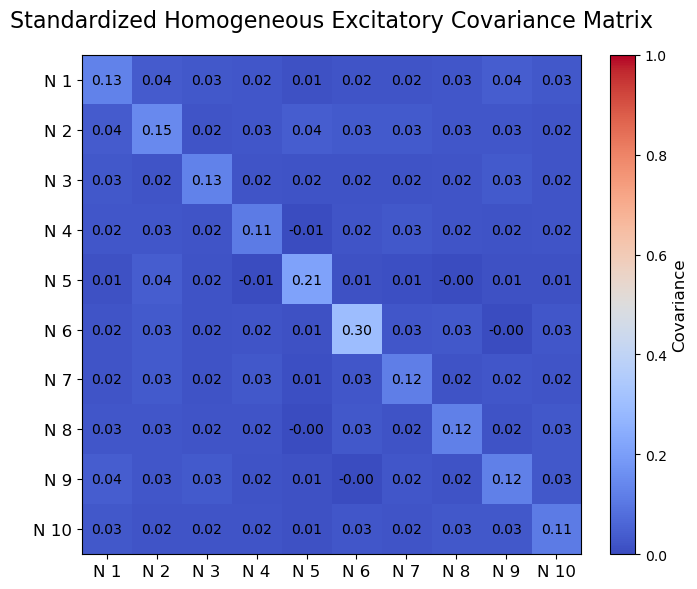

In [90]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True)

array([[ 0.12585426,  0.0375185 ,  0.02966227,  0.02449907,  0.01301822,
         0.01980853,  0.02285856,  0.0262441 ,  0.0406056 ,  0.02963599],
       [ 0.0375185 ,  0.14506444,  0.02226643,  0.02592242,  0.0416432 ,
         0.03278793,  0.03293722,  0.02643259,  0.02630257,  0.02040837],
       [ 0.02966227,  0.02226643,  0.12635027,  0.02151961,  0.01934666,
         0.01553617,  0.01858329,  0.01995031,  0.03430547,  0.02093503],
       [ 0.02449907,  0.02592242,  0.02151961,  0.1097849 , -0.00593684,
         0.02250471,  0.02946239,  0.02050946,  0.01755478,  0.02091207],
       [ 0.01301822,  0.0416432 ,  0.01934666, -0.00593684,  0.20724311,
         0.01188344,  0.00838908, -0.00229593,  0.01381757,  0.01079762],
       [ 0.01980853,  0.03278793,  0.01553617,  0.02250471,  0.01188344,
         0.28965184,  0.02486653,  0.02924359, -0.00173235,  0.02461141],
       [ 0.02285856,  0.03293722,  0.01858329,  0.02946239,  0.00838908,
         0.02486653,  0.11022717,  0.01717252

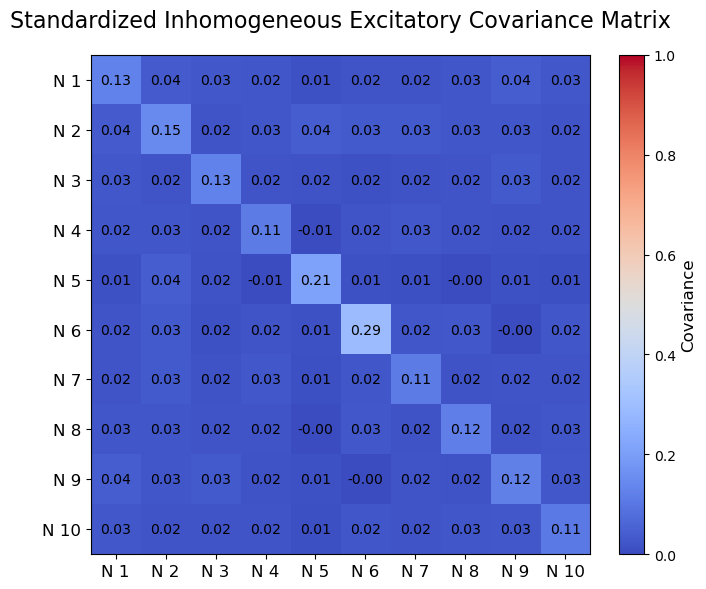

In [91]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True)

In [92]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [93]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [94]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [95]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [96]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

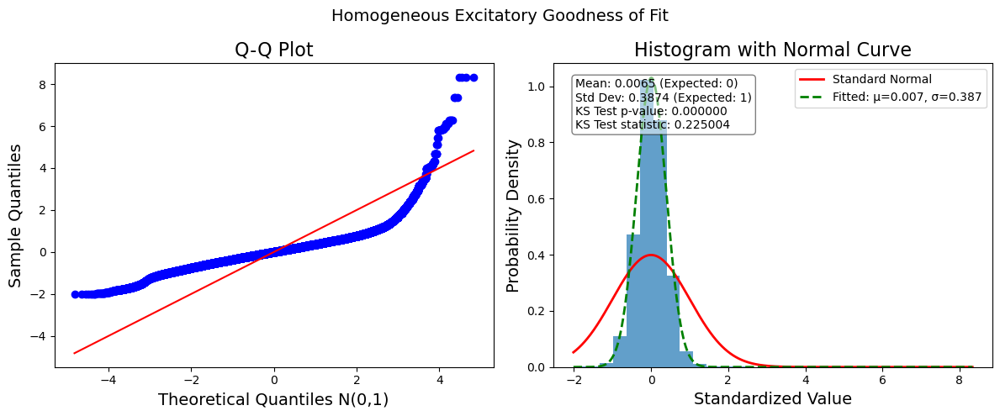

In [97]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

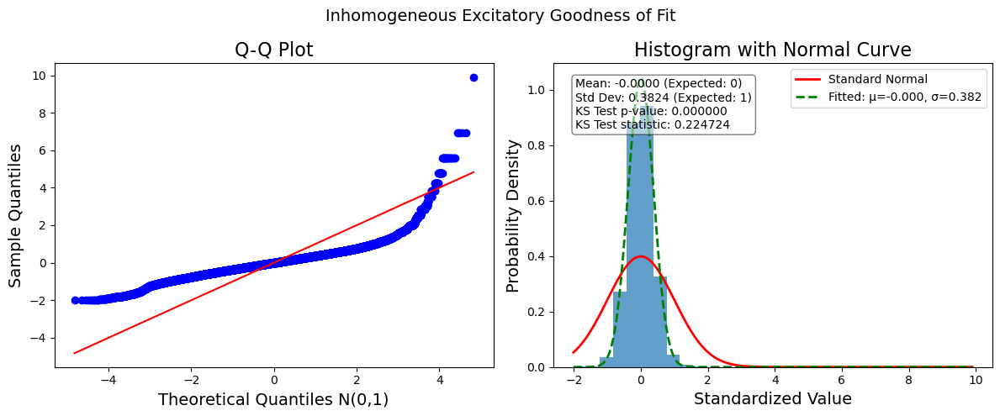

In [98]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [100]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [101]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=0, recommended exclude=1
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=1, recommended exclude=2
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=1, recommended exclude=2

Global exclude (safest): t=2


In [102]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
print(theoretical_means_sim_in)
print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
print(theoretical_std_dev_sim_in)
print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

[[0.000000e+00 2.655000e-02 5.310000e-02 ... 2.647035e+01 2.649690e+01
  2.652345e+01]
 [0.000000e+00 1.486000e-02 2.972000e-02 ... 1.481542e+01 1.483028e+01
  1.484514e+01]
 [0.000000e+00 2.091000e-02 4.182000e-02 ... 2.084727e+01 2.086818e+01
  2.088909e+01]
 ...
 [0.000000e+00 2.527000e-02 5.054000e-02 ... 2.519419e+01 2.521946e+01
  2.524473e+01]
 [0.000000e+00 2.214000e-02 4.428000e-02 ... 2.207358e+01 2.209572e+01
  2.211786e+01]
 [0.000000e+00 2.502000e-02 5.004000e-02 ... 2.494494e+01 2.496996e+01
  2.499498e+01]]
(10, 1000)
[[0.         0.16294171 0.23043437 ... 5.1449344  5.14751396 5.15009223]
 [0.         0.1219016  0.1723949  ... 3.84908041 3.85101026 3.85293914]
 [0.         0.1446029  0.20449939 ... 4.56588108 4.56817031 4.5704584 ]
 ...
 [0.         0.15896541 0.22481103 ... 5.01938144 5.02189805 5.0244134 ]
 [0.         0.14879516 0.21042814 ... 4.69825287 4.70060847 4.7029629 ]
 [0.         0.15817712 0.22369622 ... 4.99449097 4.9969951  4.99949797]]
(10, 1000)


In [103]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
print(res_var_in)

0.004115793538103807


In [104]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

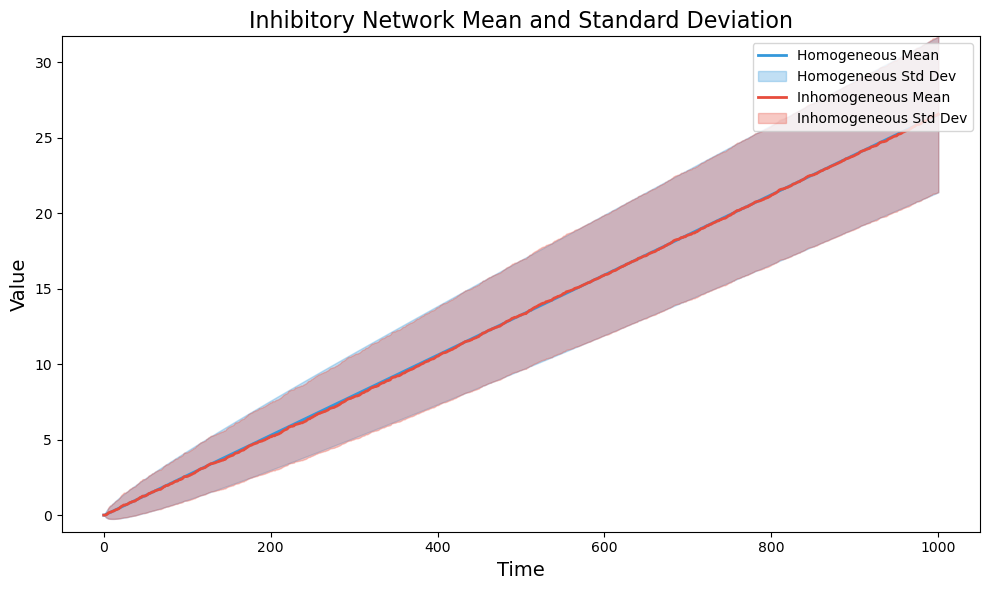

In [105]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

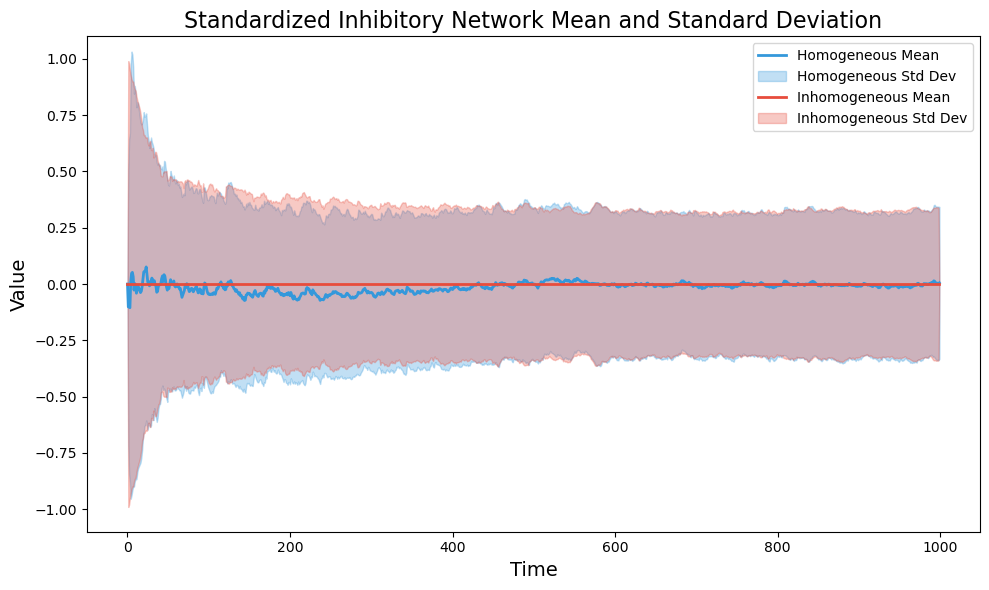

In [106]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [107]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
print(mean_check_in_emp)

{'mean': np.float64(0.00317097084059076), 'se': np.float64(0.0004075321354819747), 'CI_95%': (np.float64(0.0023722215647567655), np.float64(0.003969720116424755)), 'interpretation': 'The true population mean is estimated to be between 0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.False_, 'expected_mean_check': 'The expected mean (0) is OUTSIDE the 95% confidence interval.'}
{'mean': np.float64(-1.1961040040851386e-18), 'se': np.float64(0.00040273796857889544), 'CI_95%': (np.float64(-0.0007893528709418935), np.float64(0.0007893528709418911)), 'interpretation': 'The true population mean is estimated to be between -0.00 and 0.00 (with 95% confidence).', 'is_expected_in_CI': np.True_, 'expected_mean_check': 'The expected mean (0) is WITHIN the 95% confidence interval.'}


In [108]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [109]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [110]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 0.13854541,  0.01660564,  0.00482213,  0.0230847 ,  0.02103042,
        -0.00509484,  0.02089724,  0.02316667,  0.02743491,  0.03046633],
       [ 0.01660564,  0.24414217,  0.01809224,  0.01292994,  0.01027634,
         0.00206036, -0.00230879,  0.00206698, -0.00033006,  0.01497773],
       [ 0.00482213,  0.01809224,  0.15740071,  0.00725504,  0.03094672,
         0.00959946,  0.00434408,  0.0229251 ,  0.00324424,  0.00701025],
       [ 0.0230847 ,  0.01292994,  0.00725504,  0.14237344,  0.01562857,
         0.02475869,  0.02402869,  0.00777394,  0.00545516,  0.0135524 ],
       [ 0.02103042,  0.01027634,  0.03094672,  0.01562857,  0.19137576,
        -0.00534197,  0.02499037,  0.02740428,  0.01441492,  0.02919469],
       [-0.00509484,  0.00206036,  0.00959946,  0.02475869, -0.00534197,
         0.26831773,  0.00247726,  0.00345802, -0.00148417, -0.0113616 ],
       [ 0.02089724, -0.00230879,  0.00434408,  0.02402869,  0.02499037,
         0.00247726,  0.12426202,  0.01909486

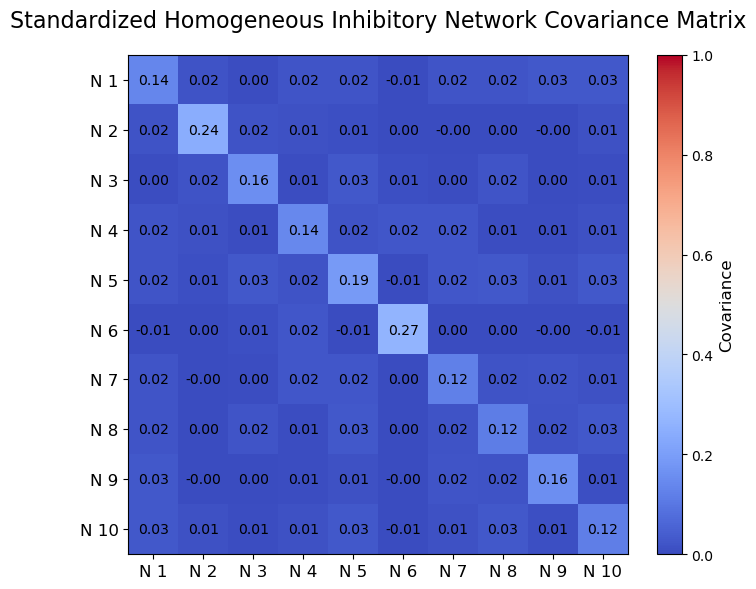

In [111]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True)

array([[ 0.13898869,  0.01686213,  0.00462084,  0.02261251,  0.02081335,
        -0.00559896,  0.02087268,  0.02316777,  0.02717067,  0.03010481],
       [ 0.01686213,  0.23703534,  0.01745453,  0.01282721,  0.00962516,
         0.00122041, -0.00262838,  0.00213684, -0.00106993,  0.01472203],
       [ 0.00462084,  0.01745453,  0.14900189,  0.0056979 ,  0.02937463,
         0.00952033,  0.00454224,  0.02232396,  0.00265819,  0.00738276],
       [ 0.02261251,  0.01282721,  0.0056979 ,  0.13228044,  0.01443457,
         0.02450112,  0.0239031 ,  0.00688251,  0.00463524,  0.01355437],
       [ 0.02081335,  0.00962516,  0.02937463,  0.01443457,  0.18140564,
        -0.00514388,  0.02478622,  0.0266214 ,  0.01295262,  0.02904016],
       [-0.00559896,  0.00122041,  0.00952033,  0.02450112, -0.00514388,
         0.27250295,  0.0023849 ,  0.00347906, -0.00106995, -0.01218603],
       [ 0.02087268, -0.00262838,  0.00454224,  0.0239031 ,  0.02478622,
         0.0023849 ,  0.12198736,  0.01905893

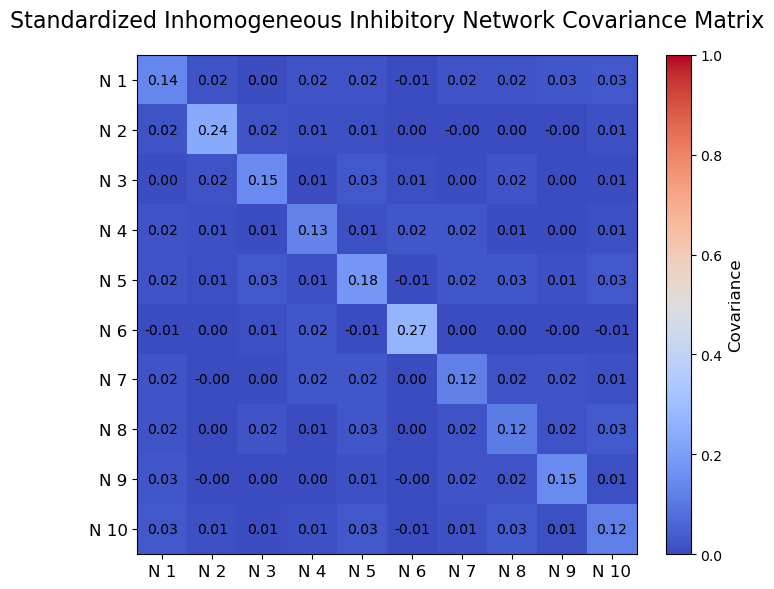

In [112]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True)

In [113]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [114]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [115]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

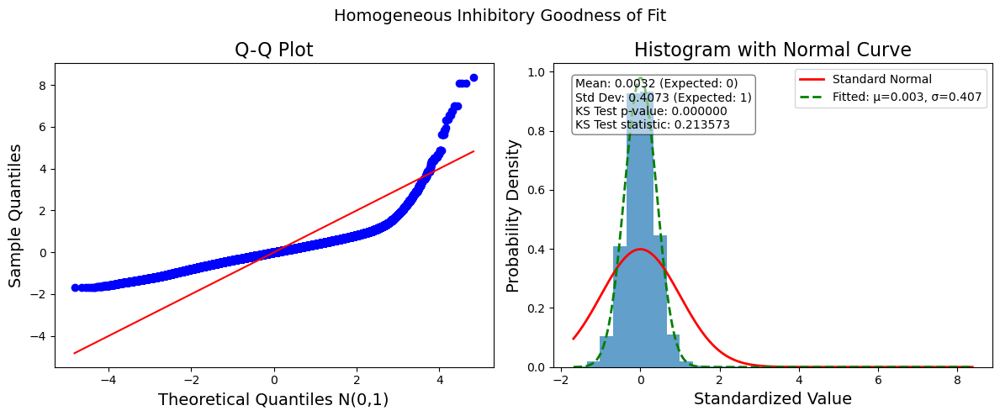

In [116]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

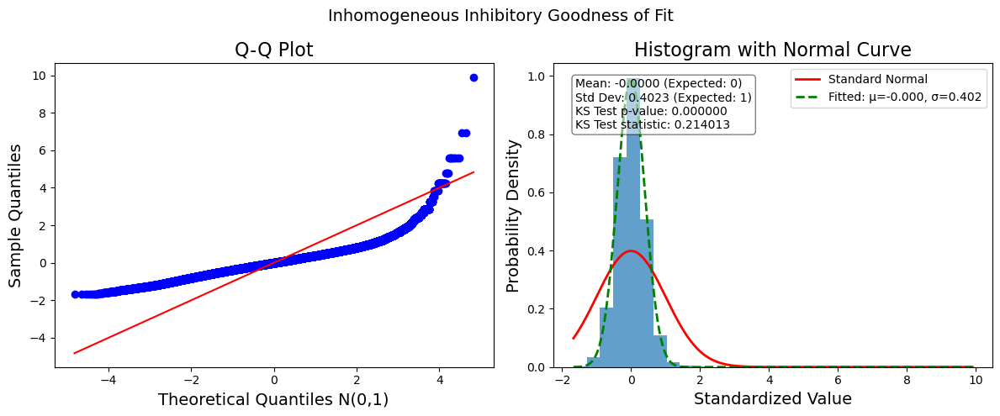

In [117]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

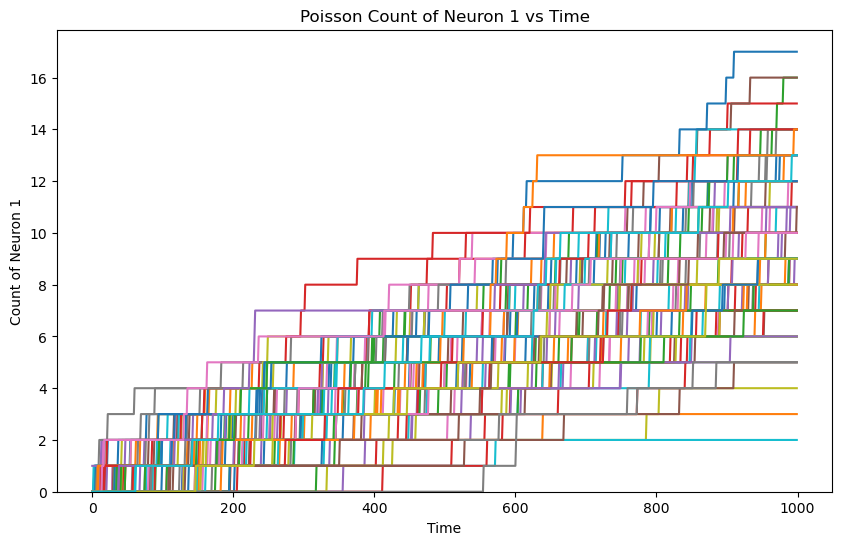

In [119]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

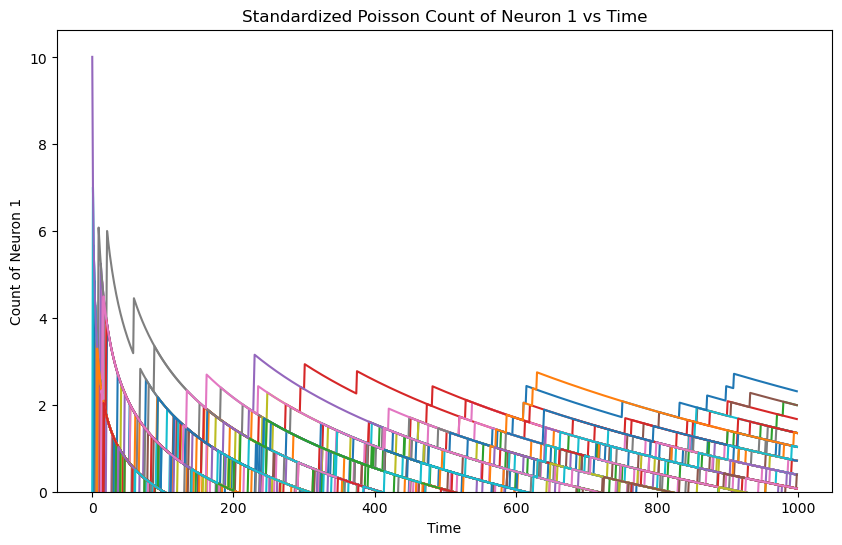

In [120]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

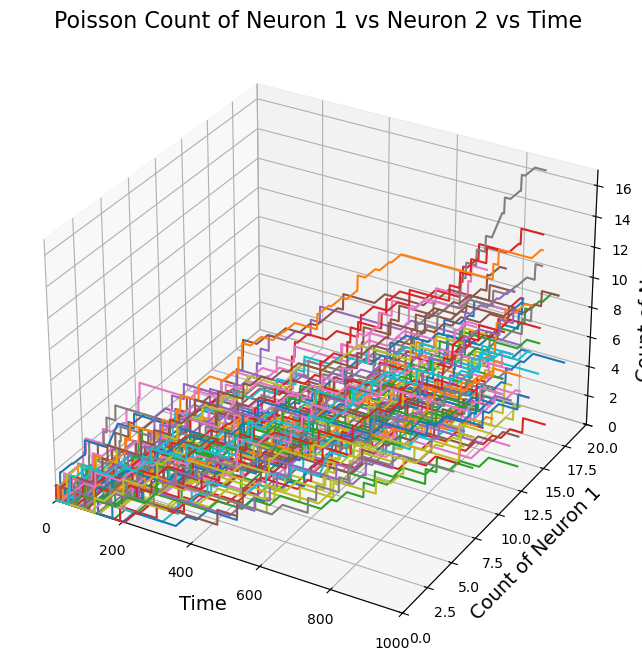

In [121]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

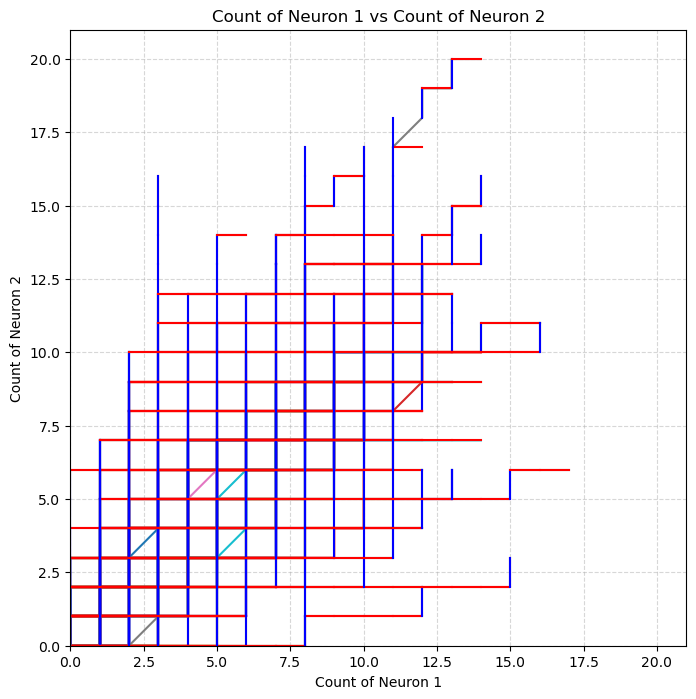

In [122]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [123]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [124]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

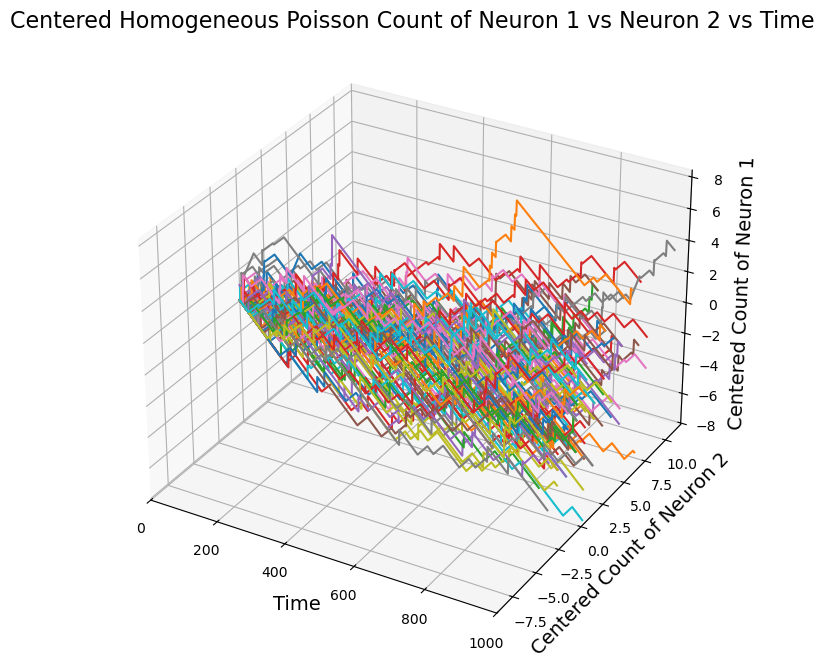

In [125]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, title = 'Centered Homogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

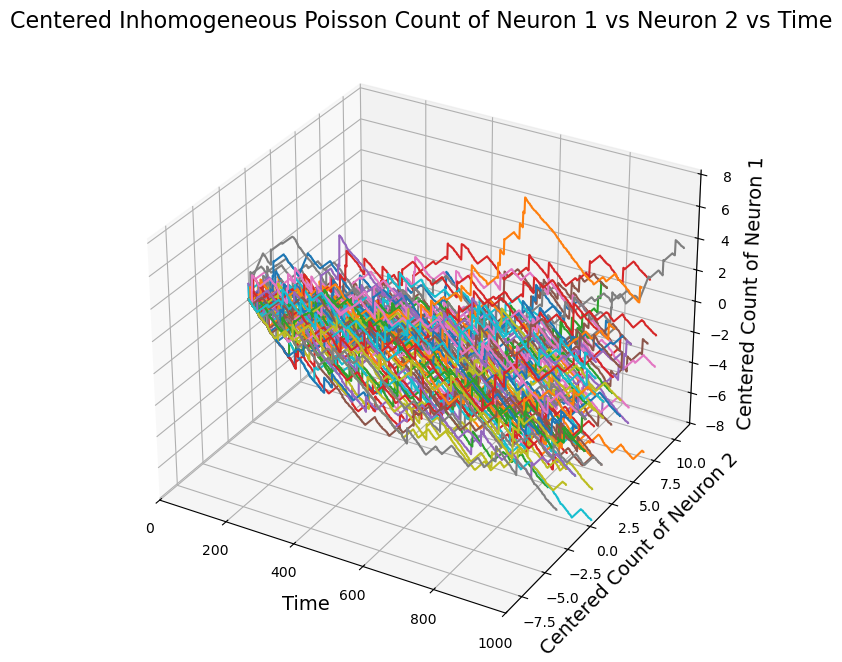

In [126]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, title = 'Centered Inhomogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]


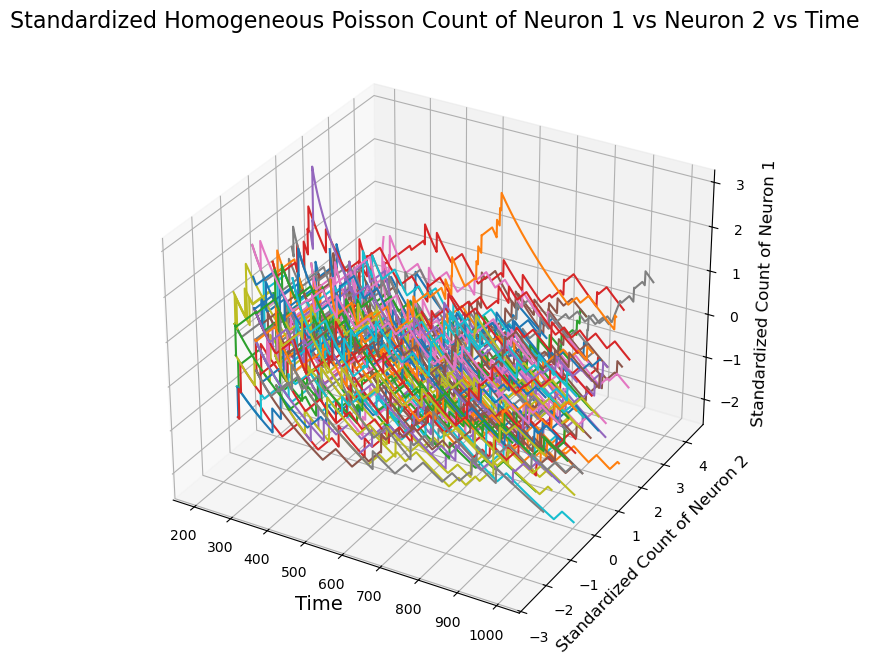

In [127]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, title = 'Standardized Homogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

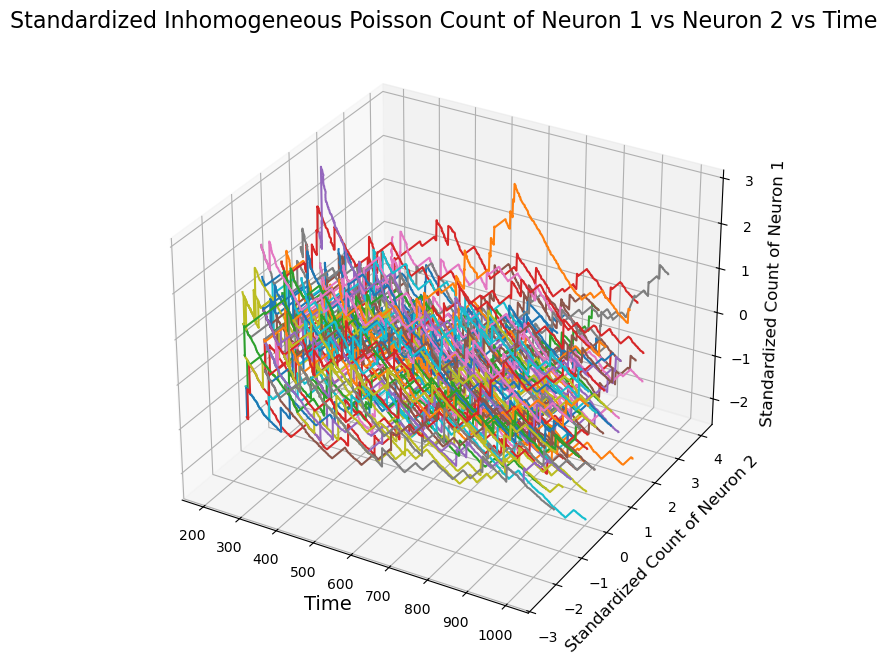

In [128]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, title = 'Standardized Inhomogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

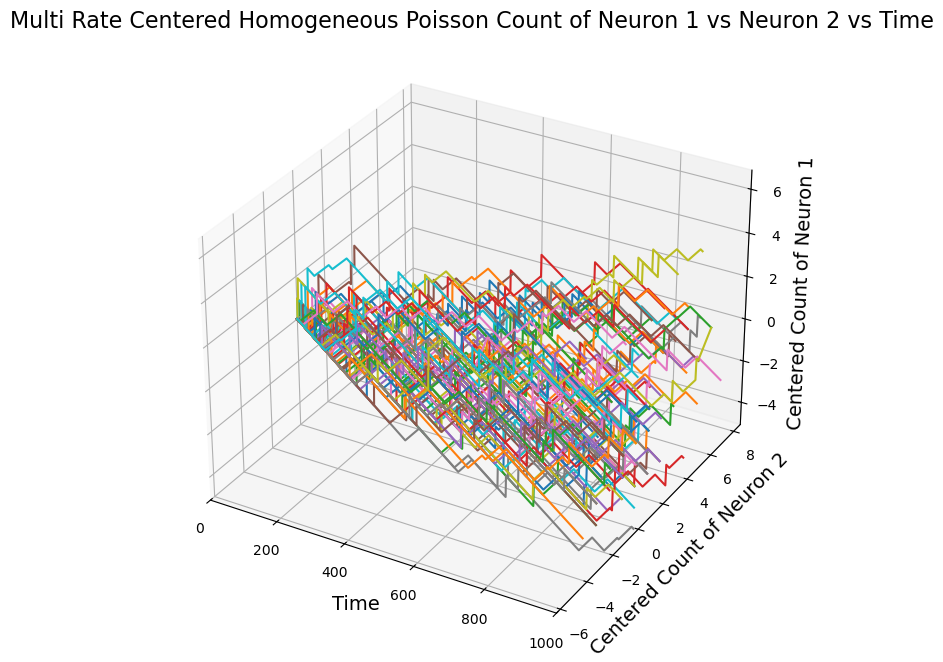

In [129]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

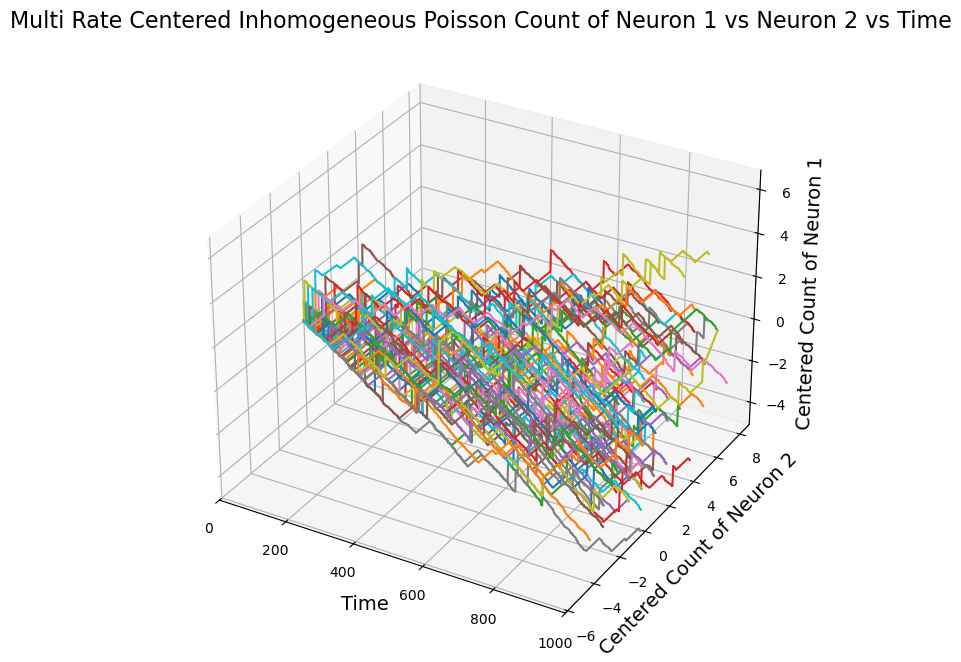

In [130]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]


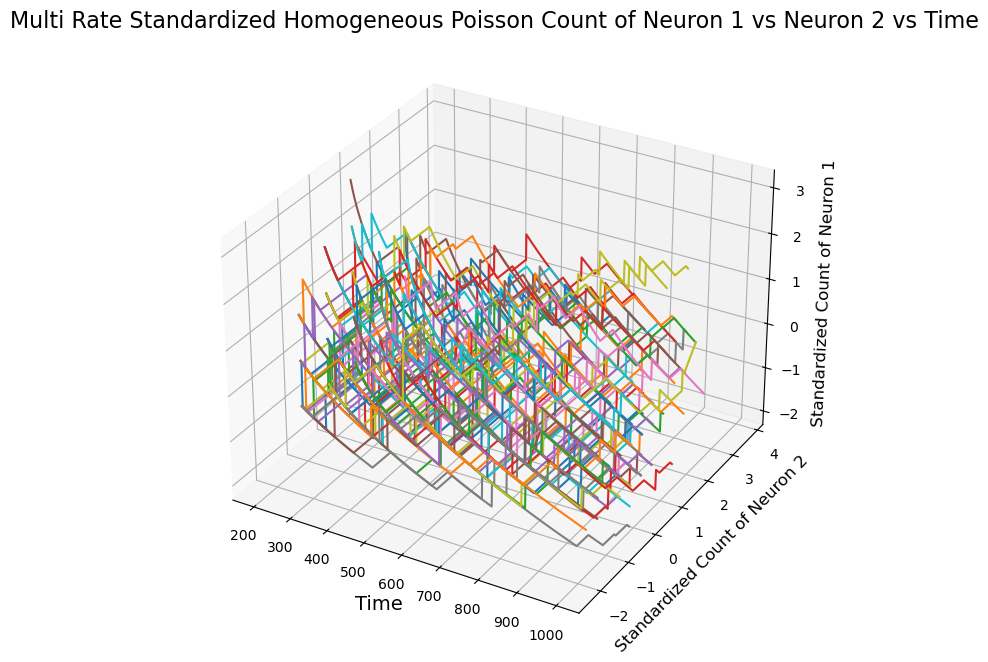

In [131]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]


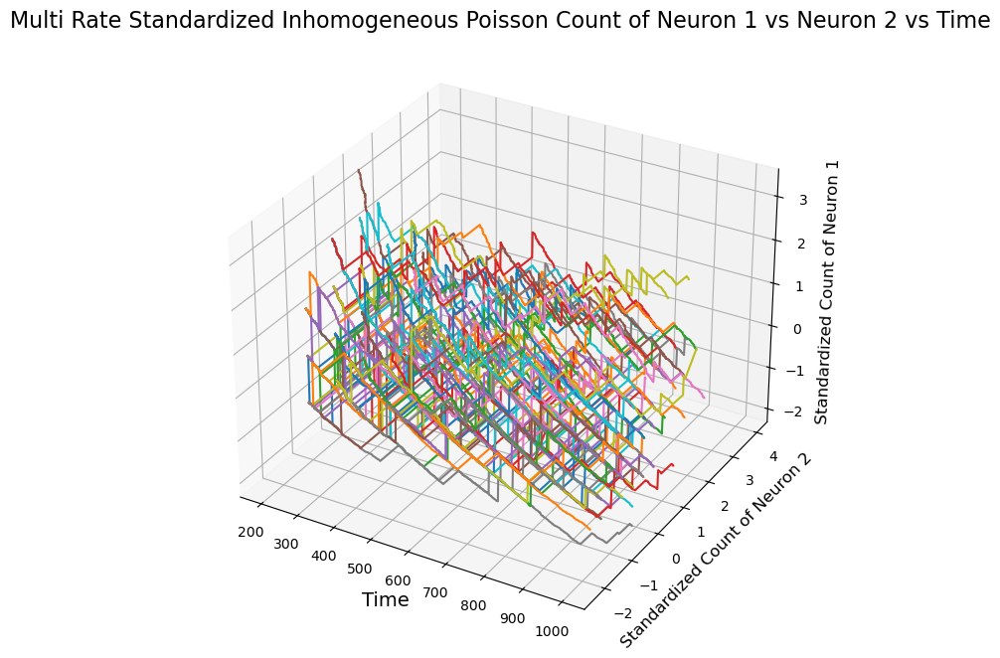

In [132]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 1 vs Neuron 2 vs Time')

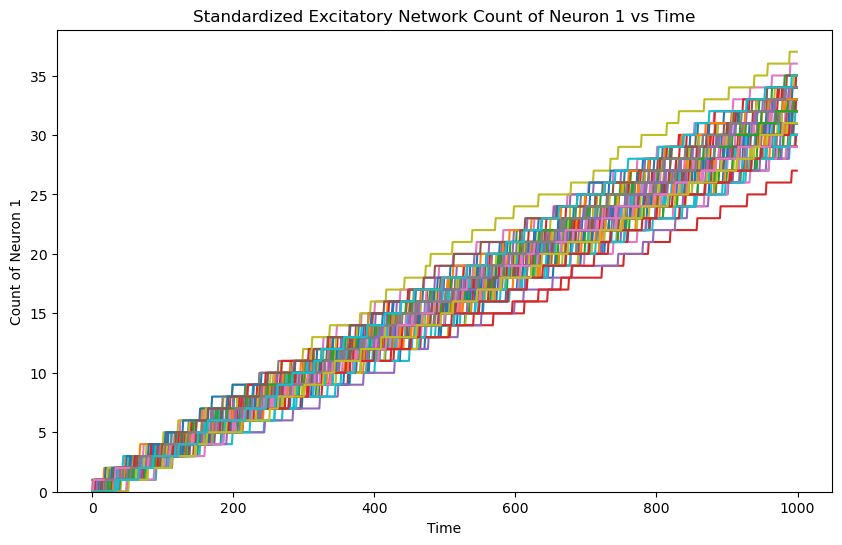

In [133]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

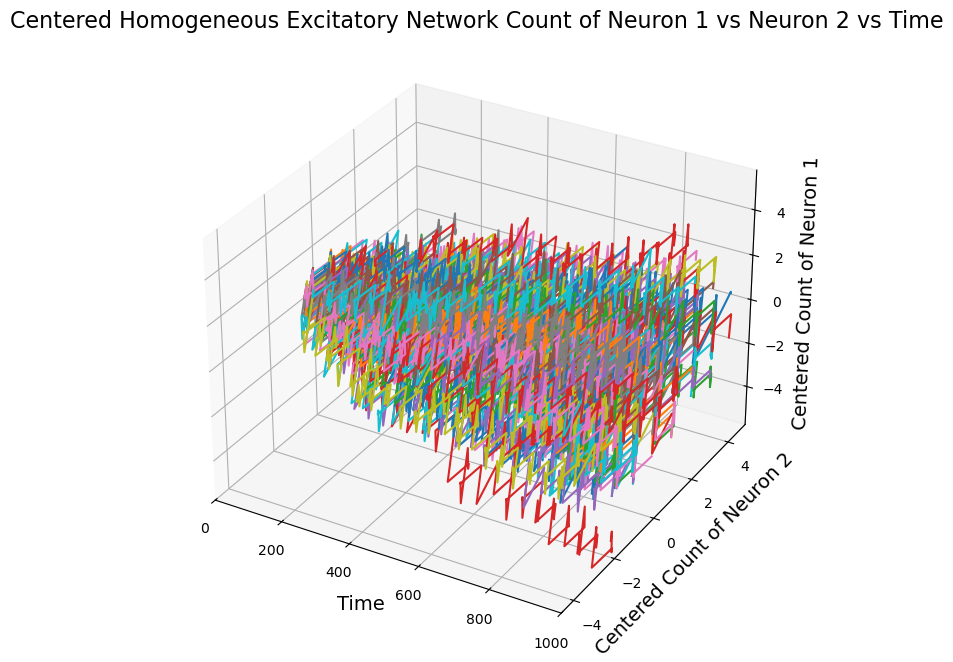

In [134]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, title = 'Centered Homogeneous Excitatory Network Count of Neuron 1 vs Neuron 2 vs Time')

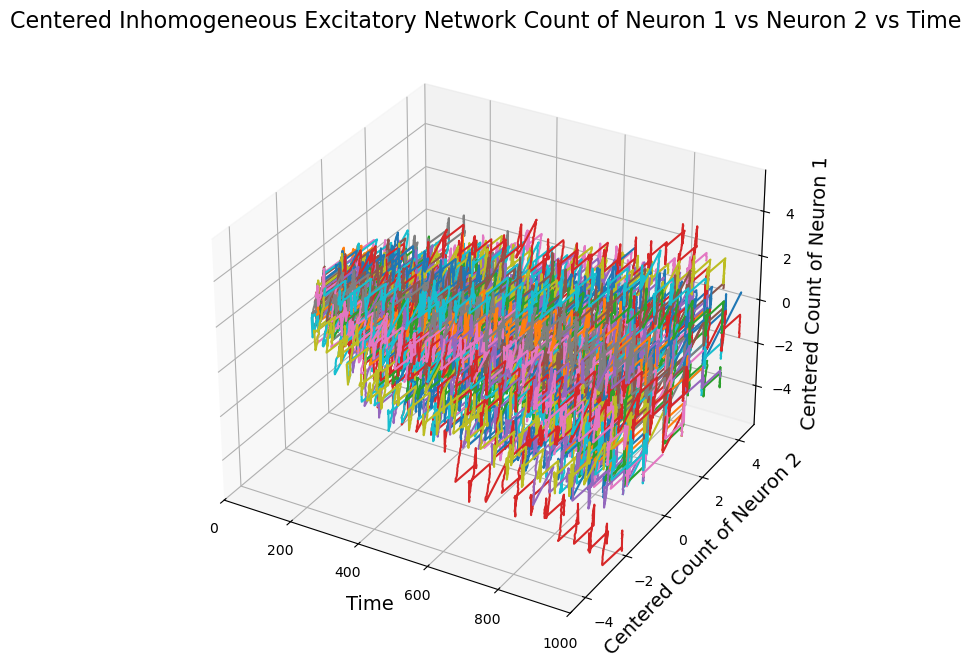

In [135]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]


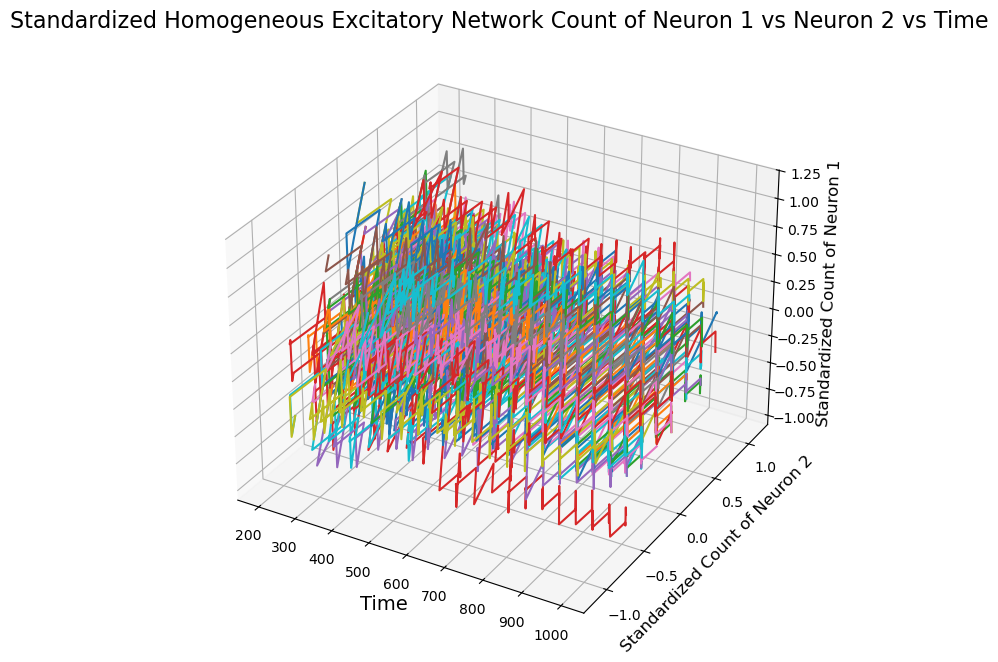

In [136]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]


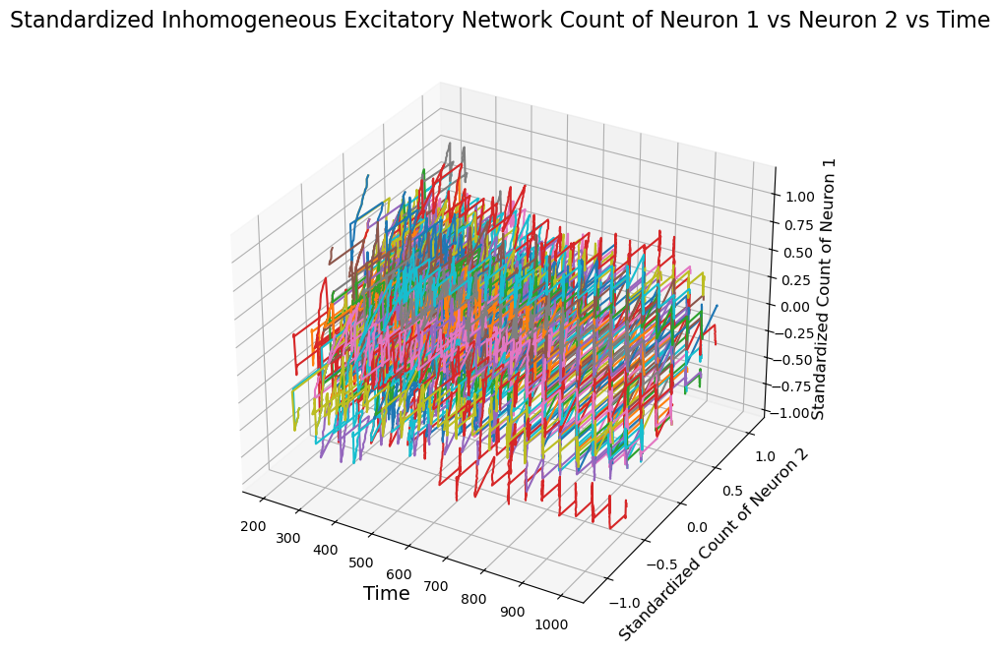

In [137]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 1 vs Neuron 2 vs Time')

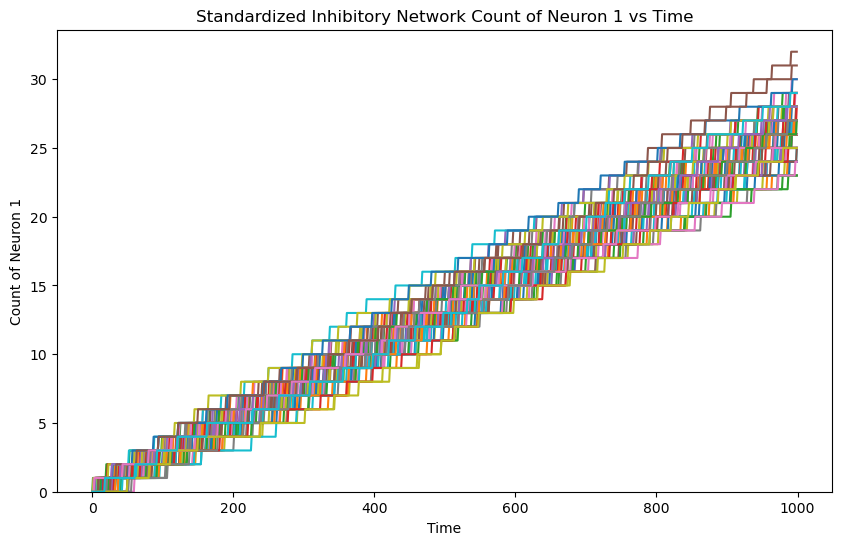

In [138]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

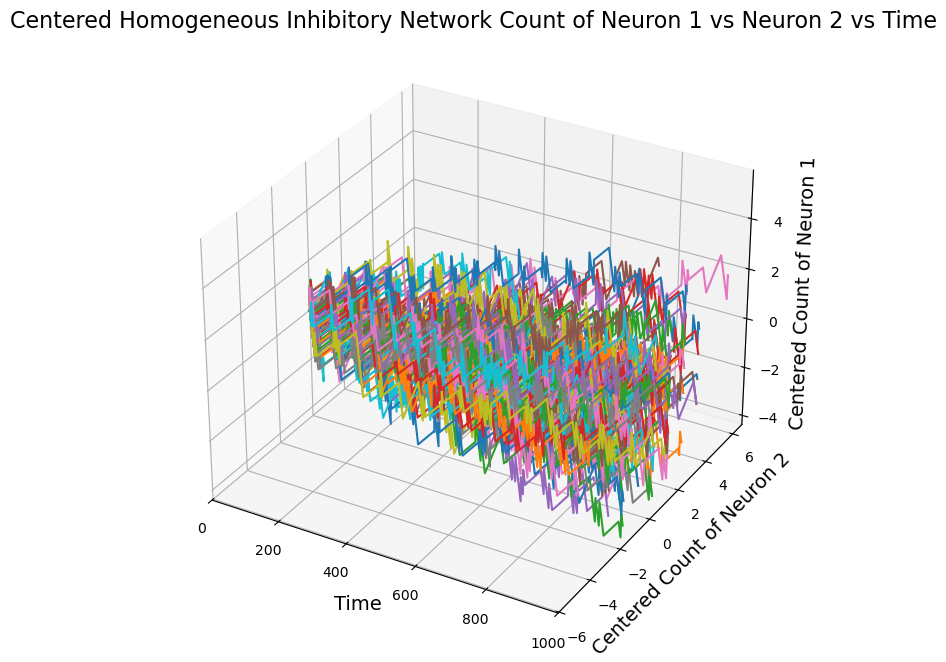

In [139]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 1 vs Neuron 2 vs Time')

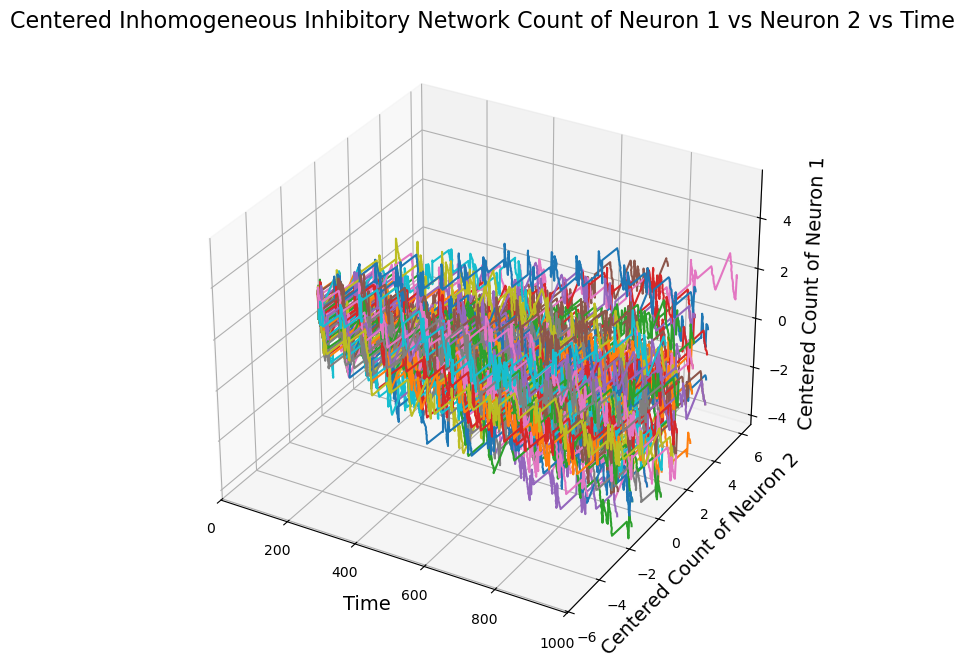

In [140]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][1] - theoretical_means[1]) / (theoretical_std_dev[1])
 [py.warnings]


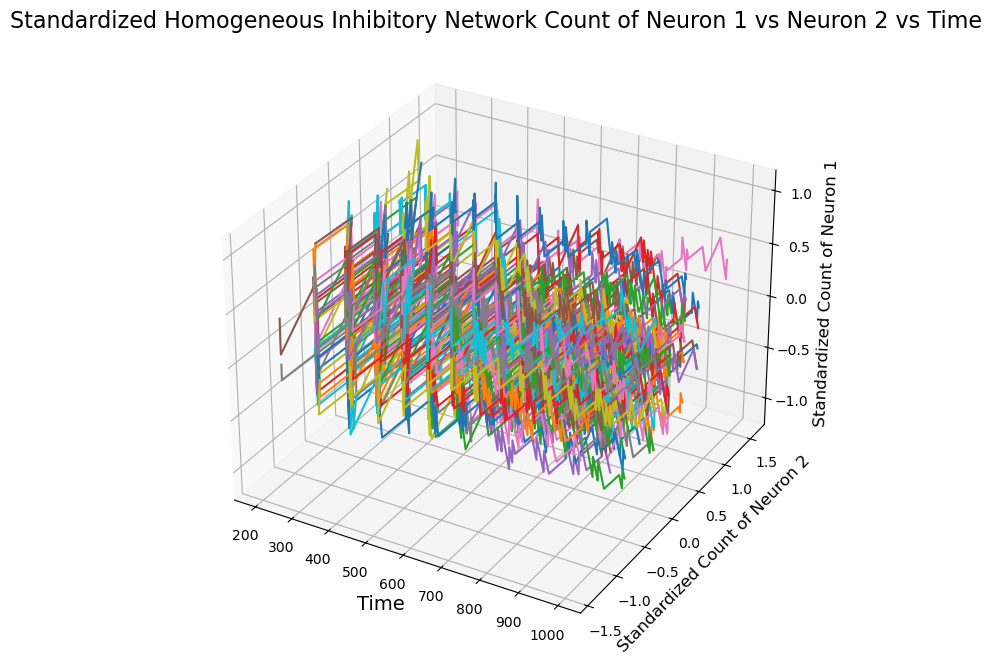

In [141]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 1 vs Neuron 2 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_37680\2039188091.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][0] - theoretical_means[0]) / (theoretical_std_dev[0])
 [py.warnings]


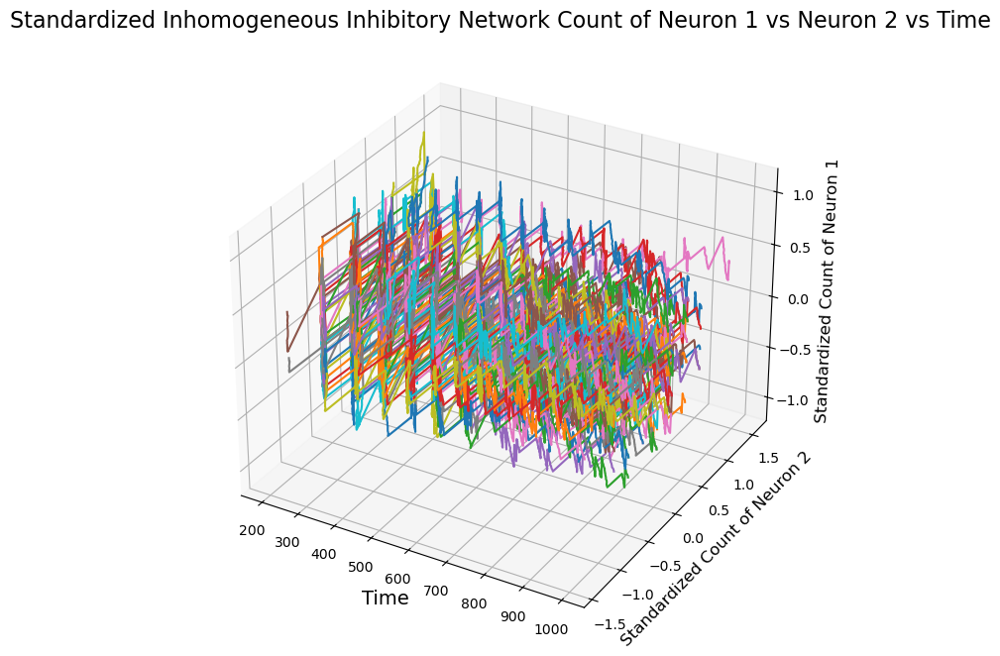

In [142]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 1 vs Neuron 2 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

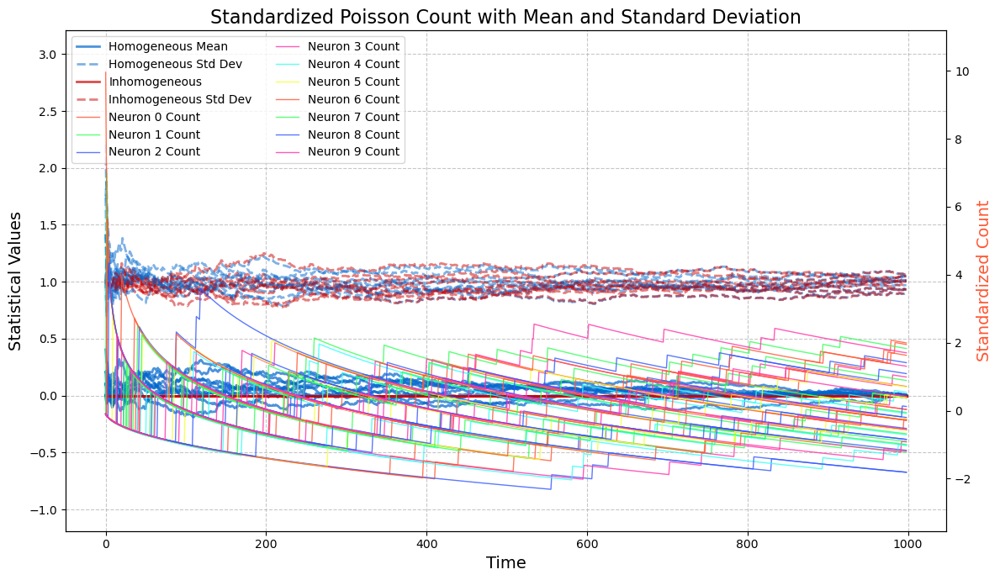

In [143]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

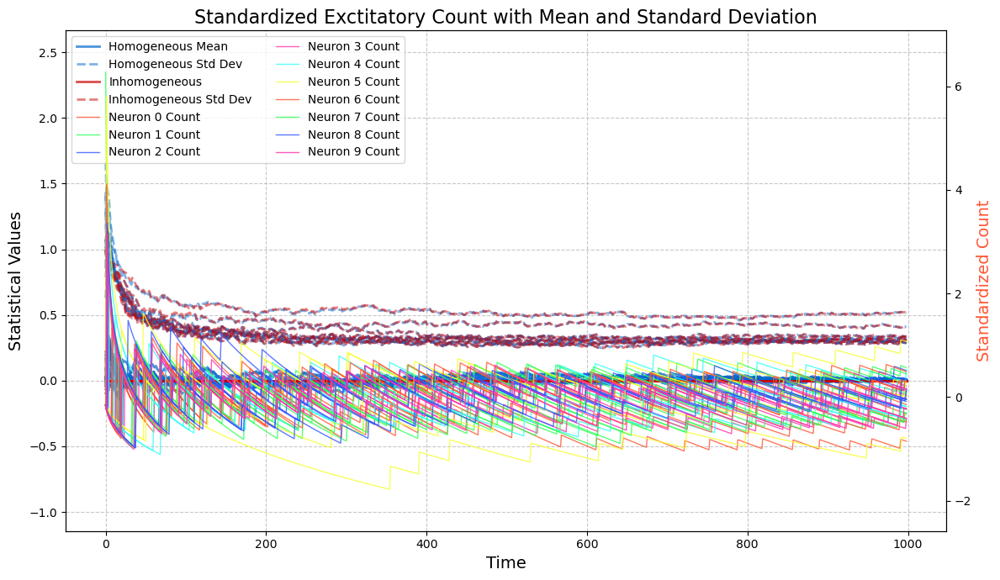

In [144]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

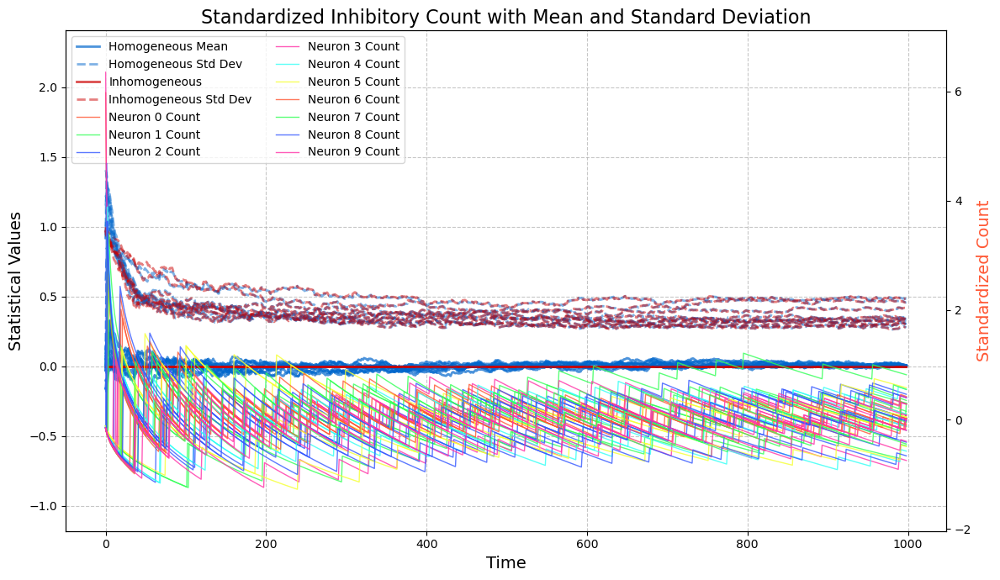

In [145]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)